COMPUTER
VISION
CAPSTONE PROJECT
AIML
PNEUMONIA DETECTION CHALLENGE

CV 1 Batch


In [1]:
#mendatory  pips to install
%pip install pydicom 
%pip install opencv-python
%pip install scikit-image

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
#import library core
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import seaborn as sns
#read dcm's
import pydicom as pdcm

#import zip 
import zipfile as zp

#import cv2 open cv
import cv2

#import image checker
from PIL import Image
from skimage import measure, morphology
from skimage.feature import graycomatrix, graycoprops 

#import math
import math

In [3]:
#lets begin with train csv convert to dataframe
train_df = pd.read_csv('stage_2_train_labels.csv')
train_df

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1


In [4]:
print(train_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB
None


In [5]:
def printwithinfoseparator(data,label):
    print(f'--------====== {label} =====-----------')
    print(data)
    print(f'---------===========-----------')

In [6]:
#to understand the information 


printwithinfoseparator(train_df['Target'].value_counts(),'Define by different target')
printwithinfoseparator(train_df[train_df['Target']== 0].isnull().sum(),'to check data with target 0 and not empty')
printwithinfoseparator(train_df[train_df['Target']== 1].isnull().sum(),'to check data with target 1 and not empty')


--------====== Define by different target =====-----------
0    20672
1     9555
Name: Target, dtype: int64
---------===========-----------
--------====== to check data with target 0 and not empty =====-----------
patientId        0
x            20672
y            20672
width        20672
height       20672
Target           0
dtype: int64
---------===========-----------
--------====== to check data with target 1 and not empty =====-----------
patientId    0
x            0
y            0
width        0
height       0
Target       0
dtype: int64
---------===========-----------


In [7]:

printwithinfoseparator(len(train_df[train_df['Target']== 1]['patientId'].unique()),'count unique with TARGET 1 ')
printwithinfoseparator(len(train_df[train_df['Target']== 0]['patientId'].unique()),'count unique with TARGET 0 ')

--------====== count unique with TARGET 1  =====-----------
6012
---------===========-----------
--------====== count unique with TARGET 0  =====-----------
20672
---------===========-----------


In [ ]:
#if you have zip and not have unzipped then and then open it otherwise it will eat you 20 min.

## for train images zip
with zp.ZipFile("stage_2_train_images.zip","r") as zip_ref:
    zip_ref.extractall("train_images")

# for test images zip
with zp.ZipFile("stage_2_test_images.zip","r") as zip_ref:
    zip_ref.extractall("test_images")

In [9]:
#just extracted  traine images file and dumped to list
images_df = os.listdir('train_images\stage_2_train_images')
printwithinfoseparator(len(images_df),'Total trained images found from zip ')


--------====== Total trained images found from zip  =====-----------
26684
---------===========-----------


In [10]:
print('double check time --> total unique patientid and total images found both numbers are same :) :D ')

double check time --> total unique patientid and total images found both numbers are same :) :D 


In [11]:
images_test_df = os.listdir('test_images\stage_2_test_images')
printwithinfoseparator(len(images_test_df),'Total test images found from zip ')


--------====== Total test images found from zip  =====-----------
3000
---------===========-----------


In [12]:
#now checking with second detail class csv and dump into dataframe
df_class = pd.read_csv('stage_2_detailed_class_info.csv')
df_class.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   patientId  30227 non-null  object
 1   class      30227 non-null  object
dtypes: object(2)
memory usage: 472.4+ KB


In [13]:
#need to merge both our dataframe based on patient id and on inner join 

mergedf=  pd.merge(train_df, df_class, on="patientId")
#remove the duplicated rows 
mergedf = mergedf.drop_duplicates()
mergedf

,patientId,x,y,width,height,Target,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity
...,...,...,...,...,...,...,...
37621,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,Lung Opacity
37623,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,Normal
37624,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,Normal
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,Lung Opacity


In [14]:
'''define a function to change the type from object / catagorical to int '''
def changeType(x):
   if x == 'No Lung Opacity / Not Normal':
       return 2
   elif x == 'Normal':
       return 0
   elif x == 'Lung Opacity':
       return 1
        


In [15]:
# apply the function to class col
mergedf['class']=mergedf['class'].apply(changeType)
mergedf

,patientId,x,y,width,height,Target,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,2
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,2
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,2
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,1
...,...,...,...,...,...,...,...
37621,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,1
37623,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,0
37624,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,0
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,1


In [16]:
#find the value count for the df 
printwithinfoseparator(mergedf['class'].value_counts(),'merge dataframe with unique class and count')
# mergedf['class'].value_counts()

--------====== merge dataframe with unique class and count =====-----------
2    11821
1     9555
0     8851
Name: class, dtype: int64
---------===========-----------


In [17]:
#to verify the data merge has class 1 and target 1 both have other labeling box data available
data_check = mergedf[(mergedf['class']== 1 )&( mergedf['Target'] ==1)]
data_check

,patientId,x,y,width,height,Target,class
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,1
6,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1,1
10,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1,1
12,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1,1
18,00aecb01-a116-45a2-956c-08d2fa55433f,288.0,322.0,94.0,135.0,1,1
...,...,...,...,...,...,...,...
37617,c1e73a4e-7afe-4ec5-8af6-ce8315d7a2f2,316.0,504.0,179.0,273.0,1,1
37619,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,609.0,464.0,240.0,284.0,1,1
37621,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,1
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,1


In [18]:
#by data check info we can check is there any missing data or now so we can eliminate or manipulate further
data_check.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9555 entries, 4 to 37627
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  9555 non-null   object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     9555 non-null   int64  
 6   class      9555 non-null   int64  
dtypes: float64(4), int64(2), object(1)
memory usage: 597.2+ KB


In [19]:
printwithinfoseparator(len(data_check['patientId'].unique()),'value with unique patient id in target')
print('which sows that some patientid have more then one bounding box present')

--------====== value with unique patient id in target =====-----------
6012
---------===========-----------
which sows that some patientid have more then one bounding box present


<Figure size 1792x1280 with 0 Axes>

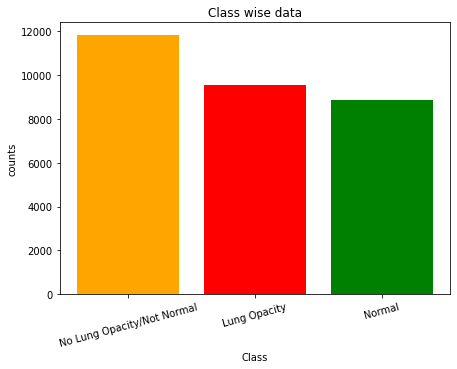

In [20]:
#plot the class wise classification 
plt.figure(figsize=(7,5),dpi=256)
fig,ax = plt.subplots(figsize=(7,5))
ax.bar(['No Lung Opacity/Not Normal','Lung Opacity','Normal'],mergedf['class'].value_counts().values,color=['orange','red','green'])
ax.tick_params(axis='x', rotation=15)
plt.xlabel('Class')
plt.ylabel('counts')
plt.title('Class wise data')
plt.show()

In [21]:
#read images dicom and get the info 
first_dicom_file = images_df[0]
first_dicom_file_path = os.path.join('train_images\\stage_2_train_images\\', first_dicom_file)
dcm = pdcm.dcmread(first_dicom_file_path)
dcm.fix_meta_info

<bound method Dataset.fix_meta_info of Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008, 0020) Study Date                          DA: '

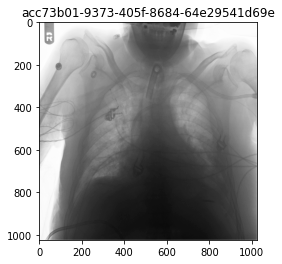

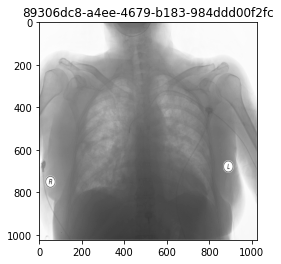

In [22]:
#just checking samples of train images 
pne_check = data_check['patientId'].sample(2)

for pni in pne_check:
    first_dicom_file_path = os.path.join('train_images\\stage_2_train_images\\', pni+'.dcm')
    dcm = pdcm.dcmread(first_dicom_file_path)
    plt.title(pni)
    plt.axis =0
    plt.imshow(dcm.pixel_array,cmap=plt.cm.binary) #used binary cmap
    plt.show()


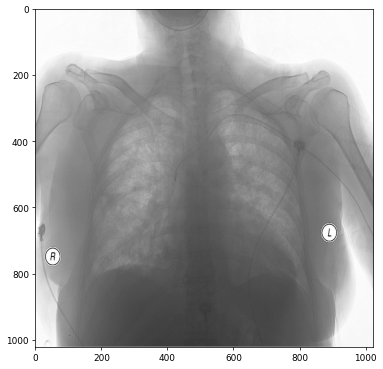

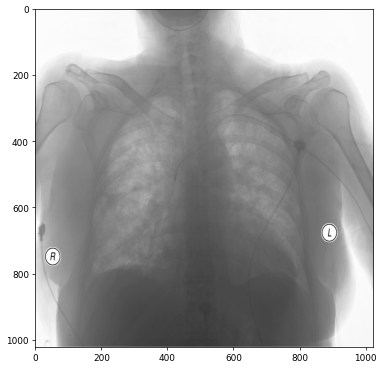

In [23]:
#try to check for the sharpanning images with sharpen filter 

image_array = dcm.pixel_array

kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

filtered_image =cv2.filter2D(image_array,-1,kernel)
plt.figure(figsize=(7,7),dpi=64)
plt.imshow((filtered_image),cmap=plt.cm.binary)
plt.show()
plt.figure(figsize=(7,7),dpi=64)
plt.imshow(dcm.pixel_array,cmap=plt.cm.binary)


In [24]:
def createfolderifnot(path):
    if not os.path.exists(path):
        os.makedirs(path)
        print(f'path create {path}')

In [25]:
path_image_train = 'train_images\\images_jpg'
createfolderifnot(path_image_train)
path_image_train512 = 'train_images\\images_512_jpg'
createfolderifnot(path_image_train512)
path_image_train256 = 'train_images\\images_256_jpg'
createfolderifnot(path_image_train256)
path_image_train128 = 'train_images\\images_128_jpg'
createfolderifnot(path_image_train128)

In [26]:
info_df = mergedf.copy()
total_images = info_df['patientId'].unique()


In [27]:
info_df['AGE'] = 0
info_df['SEX'] = 0
info_df['ViewPosition']=''
info_df['BodyPart'] = ''
info_df['glcm_contrast'] = ''
info_df['glcm_homogeneity'] = ''
info_df['glcm_energy'] = ''
info_df['glcm_correlation'] = ''


In [ ]:
## loop for the image to get meta data for age sex body part and view position
for i in total_images:
    path = f'train_images\\stage_2_train_images\\{i}.dcm'
    if os.path.isfile(path):
        first_dicom_file_path = os.path.join(path)
        dcm_read = pdcm.dcmread(first_dicom_file_path)
        img = Image.fromarray(dcm_read.pixel_array)
        img.save(f'{path_image_train}\\{i}.jpg')
        img2 = img.resize((512, 512))
        img2.save(f'{path_image_train512}\\{i}.jpg')
        img256 = img.resize((256, 256))
        img256.save(f'{path_image_train256}\\{i}.jpg')
        img128 = img.resize((128, 128))
        img128.save(f'{path_image_train128}\\{i}.jpg')
        image_array = np.array(img128)
    
        # Example: Thresholding to segment lung regions
        # threshold = -50  # Adjust threshold value based on DICOM pixel intensity range
        # lung_mask = image_array < threshold
        
        distances = [1, 2, 3]  # Adjust distances based on image resolution
        angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
        glcm = graycomatrix(image_array.astype(np.uint8), distances, angles, symmetric=True, normed=True)
        # print(glcm)
        for il in info_df[info_df['patientId']== i].index:
            # print(f'image done {il}')
            info_df.loc[il,'AGE'] = dcm_read.PatientAge
            info_df.loc[il,'SEX'] = 0 if dcm_read.PatientSex == 'F' else 1
            info_df.loc[il,'BodyPart'] =dcm_read.BodyPartExamined
            info_df.loc[il,'ViewPosition'] =dcm_read.ViewPosition
            info_df.loc[il,'glcm_contrast'] =  graycoprops(glcm, 'contrast').mean()
            info_df.loc[il,'glcm_homogeneity'] = graycoprops(glcm, 'homogeneity').mean()
            info_df.loc[il,'glcm_energy'] = graycoprops(glcm, 'energy').mean()
            info_df.loc[il,'glcm_correlation'] = graycoprops(glcm, 'correlation').mean()

    else:
        print('nofile found ',i)
    

In [29]:
info_df.to_csv('infodf.csv')

In [30]:
info_df = pd.read_csv('infodf.csv')
info_df = info_df[info_df.columns[1:]]
info_df


,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,2,51,0,PA,CHEST,240.363107,0.221791,0.041201,0.977566
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,2,48,0,PA,CHEST,52.810114,0.333943,0.077472,0.983760
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,2,19,1,AP,CHEST,220.881035,0.200721,0.025836,0.968193
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,0,28,1,PA,CHEST,406.426794,0.165048,0.019650,0.954598
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,1,32,0,AP,CHEST,86.499986,0.236534,0.020687,0.986255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,185.0,298.0,228.0,379.0,1,1,54,1,AP,CHEST,251.202459,0.243280,0.057668,0.932018
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,0,46,0,PA,CHEST,139.894010,0.238966,0.074233,0.985241
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,0,45,1,PA,CHEST,325.506092,0.212639,0.023197,0.924871
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,1,72,0,AP,CHEST,198.700831,0.227273,0.023604,0.973146


In [31]:
glcmcol = [ 'glcm_contrast', 'glcm_homogeneity','glcm_energy', 'glcm_correlation']
for i in glcmcol:
    info_df[i] = pd.to_numeric(info_df[i])

info_df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   patientId         30227 non-null  object 
 1   x                 9555 non-null   float64
 2   y                 9555 non-null   float64
 3   width             9555 non-null   float64
 4   height            9555 non-null   float64
 5   Target            30227 non-null  int64  
 6   class             30227 non-null  int64  
 7   AGE               30227 non-null  int64  
 8   SEX               30227 non-null  int64  
 9   ViewPosition      30227 non-null  object 
 10  BodyPart          30227 non-null  object 
 11  glcm_contrast     30227 non-null  float64
 12  glcm_homogeneity  30227 non-null  float64
 13  glcm_energy       30227 non-null  float64
 14  glcm_correlation  30227 non-null  float64
dtypes: float64(8), int64(4), object(3)
memory usage: 3.5+ MB


In [32]:
info_df.describe(include='all')

,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation
count,30227,9555.000000,9555.000000,9555.000000,9555.000000,30227.000000,30227.000000,30227.000000,30227.000000,30227,30227,30227.000000,30227.000000,30227.000000,30227.000000
unique,26684,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,1,NaN,NaN,NaN,NaN
top,3239951b-6211-4290-b237-3d9ad17176db,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AP,CHEST,NaN,NaN,NaN,NaN
freq,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15297,30227,NaN,NaN,NaN,NaN
mean,NaN,394.047724,366.839560,218.471376,329.269702,0.316108,1.098257,46.797764,0.569557,NaN,NaN,247.026187,0.229017,0.041265,0.962661
std,NaN,204.574172,148.940488,59.289475,157.750755,0.464963,0.821133,16.892940,0.495146,NaN,NaN,136.758147,0.052652,0.044948,0.017100
min,NaN,2.000000,2.000000,40.000000,45.000000,0.000000,0.000000,1.000000,0.000000,NaN,NaN,15.571242,0.091079,0.012571,0.745418
25%,NaN,207.000000,249.000000,177.000000,203.000000,0.000000,0.000000,34.000000,0.000000,NaN,NaN,143.653314,0.193911,0.022976,0.954354
50%,NaN,324.000000,365.000000,217.000000,298.000000,0.000000,1.000000,49.000000,1.000000,NaN,NaN,228.389563,0.222584,0.028748,0.965842
75%,NaN,594.000000,478.500000,259.000000,438.000000,1.000000,2.000000,59.000000,1.000000,NaN,NaN,321.095833,0.255714,0.041918,0.974290


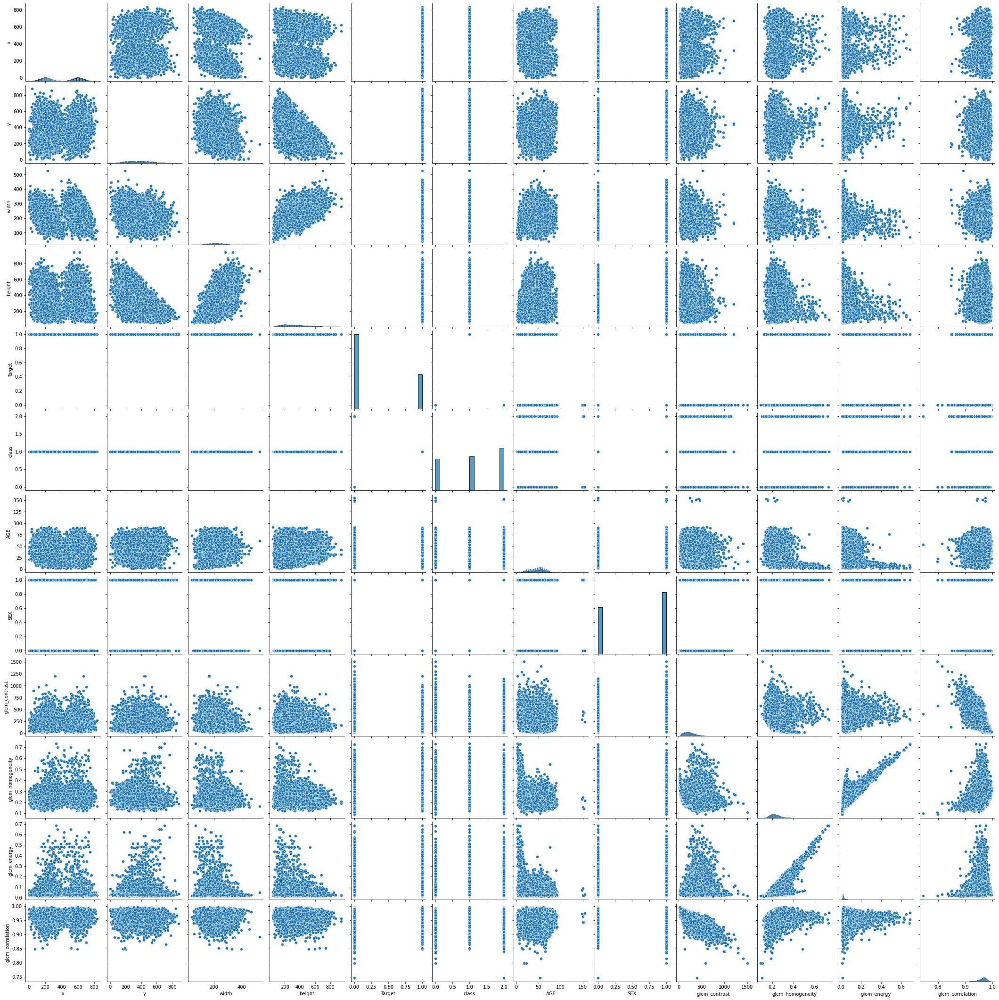

In [33]:
sns.pairplot(data=info_df)

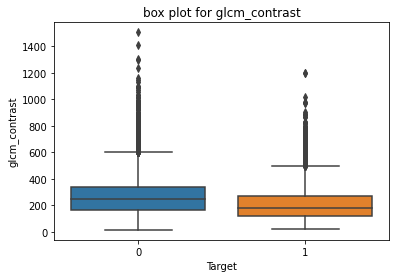

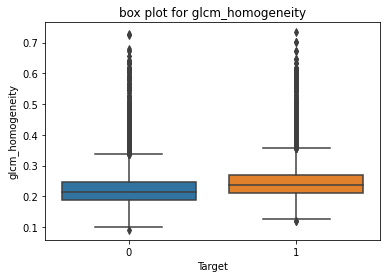

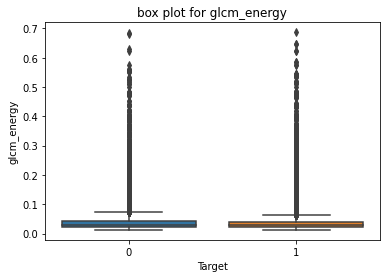

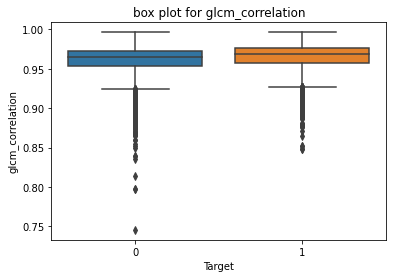

In [34]:
for i in glcmcol:
    plt.title(f'box plot for {i}')
    sns.boxplot(data=info_df,x='Target',y=i)
    plt.show()

<AxesSubplot:>

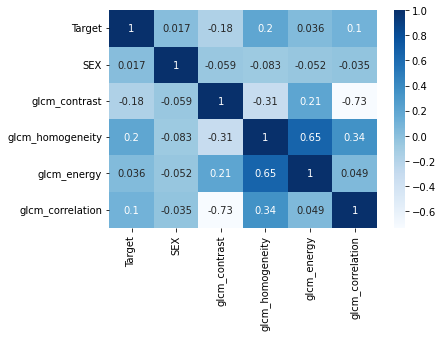

In [35]:
targetcols = ['Target','SEX','glcm_contrast', 'glcm_homogeneity','glcm_energy', 'glcm_correlation']
df_cor = info_df[targetcols]
sns.heatmap(data=df_cor.corr(),cmap=plt.cm.Blues,annot=True)

In [36]:
printwithinfoseparator(info_df['BodyPart'].value_counts(),'body part value uniqueness check')
printwithinfoseparator(info_df['ViewPosition'].value_counts(),'view position value uniqueness check')
printwithinfoseparator(info_df['SEX'].value_counts(),'Sex value uniqueness check')


--------====== body part value uniqueness check =====-----------
CHEST    30227
Name: BodyPart, dtype: int64
---------===========-----------
--------====== view position value uniqueness check =====-----------
AP    15297
PA    14930
Name: ViewPosition, dtype: int64
---------===========-----------
--------====== Sex value uniqueness check =====-----------
1    17216
0    13011
Name: SEX, dtype: int64
---------===========-----------


In [37]:
info_df['AGE'].describe()

count    30227.000000
mean        46.797764
std         16.892940
min          1.000000
25%         34.000000
50%         49.000000
75%         59.000000
max        155.000000
Name: AGE, dtype: float64

In [38]:
info_df_512 = info_df.copy()

In [39]:
size = 512
def calculatetheimageboundings(x):
    mainsize = 1024
    # print(x)
    if x > 0:
        divider = mainsize//size
        # print(divider)
        _x  = x//divider
        # print(_x)
        return _x

In [40]:
size=512
info_df_512['x'] = info_df_512['x'].apply(calculatetheimageboundings)
info_df_512['y'] = info_df_512['y'].apply(calculatetheimageboundings)
info_df_512['width'] = info_df_512['width'].apply(calculatetheimageboundings)
info_df_512['height'] = info_df_512['height'].apply(calculatetheimageboundings)

In [41]:
info_df_512

,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,2,51,0,PA,CHEST,240.363107,0.221791,0.041201,0.977566
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,2,48,0,PA,CHEST,52.810114,0.333943,0.077472,0.983760
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,2,19,1,AP,CHEST,220.881035,0.200721,0.025836,0.968193
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,0,28,1,PA,CHEST,406.426794,0.165048,0.019650,0.954598
4,00436515-870c-4b36-a041-de91049b9ab4,132.0,76.0,106.0,189.0,1,1,32,0,AP,CHEST,86.499986,0.236534,0.020687,0.986255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,92.0,149.0,114.0,189.0,1,1,54,1,AP,CHEST,251.202459,0.243280,0.057668,0.932018
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,0,46,0,PA,CHEST,139.894010,0.238966,0.074233,0.985241
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,0,45,1,PA,CHEST,325.506092,0.212639,0.023197,0.924871
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,285.0,196.0,130.0,172.0,1,1,72,0,AP,CHEST,198.700831,0.227273,0.023604,0.973146


In [42]:


# function to draw bounding Box on images
def get_bb(imag,data_lab,patid):
  
  for i in range(len(data_lab)):
    if data_lab.iloc[i]['patientId']==patid and data_lab.iloc[i]['Target']==1:
      x= int(data_lab.iloc[i]['x'])
      y= int(data_lab.iloc[i]['y'])                                                     
      w= int(data_lab.iloc[i]['width'])
      h= int(data_lab.iloc[i]['height'])
      bb=cv2.rectangle(imag,(x,y),(x+w,y+h),(255,0,0),3)
      plt.imshow(bb,cmap=plt.cm.binary)
      
      
    elif data_lab.iloc[i]['patientId']==patid and data_lab.iloc[i]['Target']==0:
      plt.imshow(imag,cmap=plt.cm.binary) 
      
  plt.show()

In [43]:
patid_ref = info_df[info_df['Target'] == 1]['patientId'].sample(5)
patid_ref

3821     3ae783bc-9fd3-4e66-b9cd-101a43f122bd
19470    b4abc0a4-600c-4834-bd71-c9dbb21eaaf0
24683    ddb757d1-a6e2-42e3-a438-100006fb38dd
20303    ba452891-fb43-48bf-9019-855556b48f91
18370    ad7bfead-6c0b-436f-9d0b-92827be703c3
Name: patientId, dtype: object

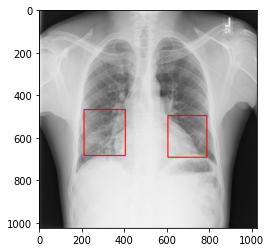

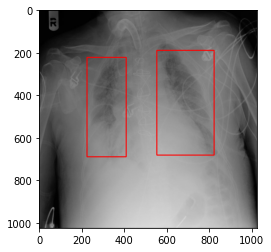

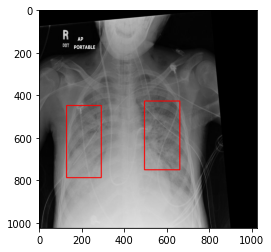

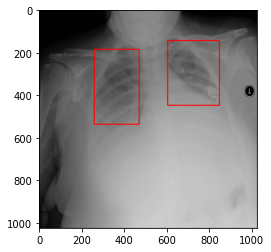

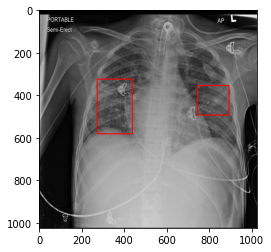

In [44]:
for i in patid_ref: 
    img1= cv2.imread(f'train_images\images_jpg\{i}.jpg')
    get_bb(img1,info_df,i)

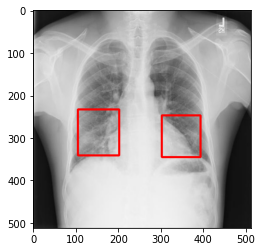

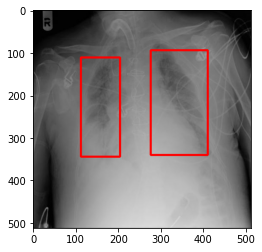

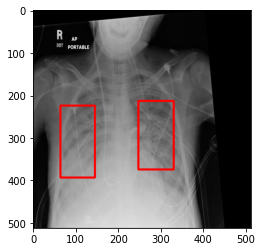

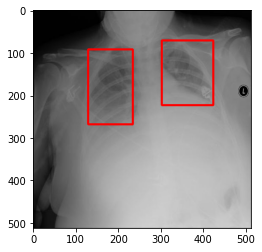

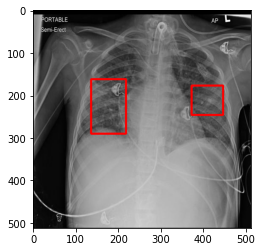

In [45]:
for i in patid_ref: 
    img1= cv2.imread(f'train_images\images_512_jpg\{i}.jpg')
    get_bb(img1,info_df_512,i)

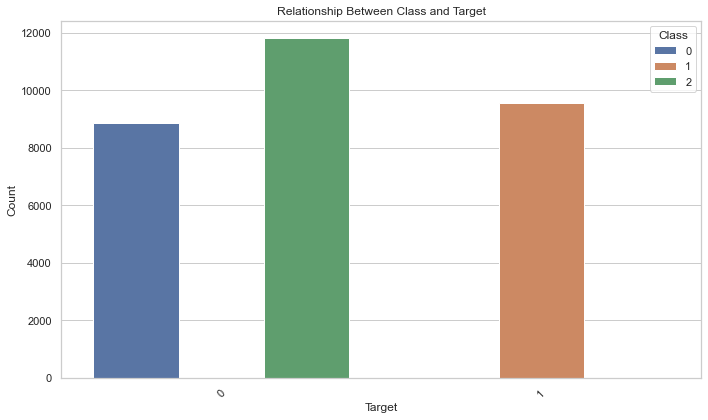

In [46]:
sns.set(style="whitegrid")

# Create the countplot
plt.figure(figsize=(10, 6))
sns.countplot(x='Target', hue='class', data=info_df)
plt.title('Relationship Between Class and Target')
plt.xlabel('Target')
plt.ylabel('Count')
plt.legend(title='Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


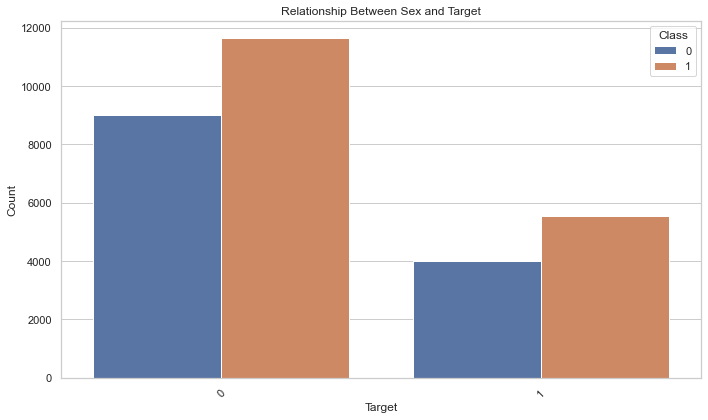

In [47]:
sns.set(style="whitegrid")

# Create the countplot
plt.figure(figsize=(10, 6))
sns.countplot(x='Target', hue='SEX', data=info_df)
plt.title('Relationship Between Sex and Target')
plt.xlabel('Target')
plt.ylabel('Count')
plt.legend(title='Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

C:\Users\JAYPAT~1\AppData\Local\Temp/ipykernel_25200/2878436323.py:8: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=lung_opacity_data, x='x', shade=True, color='blue')
C:\Users\JAYPAT~1\AppData\Local\Temp/ipykernel_25200/2878436323.py:12: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=lung_opacity_data, x='y', shade=True, color='green')
C:\Users\JAYPAT~1\AppData\Local\Temp/ipykernel_25200/2878436323.py:16: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=lung_opacity_data, x='width', shade=True, color='orange')
C:\Users\JAYPAT~1\AppData\Local\Temp/ipykernel_25200/2878436323.py:20: FutureWarning: 

`shade` is n

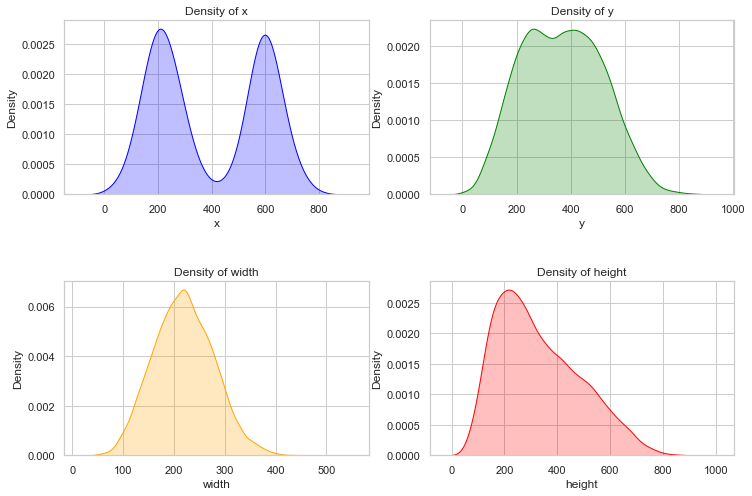

In [48]:
lung_opacity_data = info_df[info_df['Target'] == 1]

# Plotting
plt.figure(figsize=(12, 8))
plt.subplots_adjust(hspace=0.5)

plt.subplot(2, 2, 1)
sns.kdeplot(data=lung_opacity_data, x='x', shade=True, color='blue')
plt.title('Density of x')

plt.subplot(2, 2, 2)
sns.kdeplot(data=lung_opacity_data, x='y', shade=True, color='green')
plt.title('Density of y')

plt.subplot(2, 2, 3)
sns.kdeplot(data=lung_opacity_data, x='width', shade=True, color='orange')
plt.title('Density of width')

plt.subplot(2, 2, 4)
sns.kdeplot(data=lung_opacity_data, x='height', shade=True, color='red')
plt.title('Density of height')

plt.show()

C:\Users\JAYPAT~1\AppData\Local\Temp/ipykernel_25200/2122389849.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  info_df.hist(ax=ax)


array([[<AxesSubplot:title={'center':'x'}>,
        <AxesSubplot:title={'center':'y'}>,
        <AxesSubplot:title={'center':'width'}>],
       [<AxesSubplot:title={'center':'height'}>,
        <AxesSubplot:title={'center':'Target'}>,
        <AxesSubplot:title={'center':'class'}>],
       [<AxesSubplot:title={'center':'AGE'}>,
        <AxesSubplot:title={'center':'SEX'}>,
        <AxesSubplot:title={'center':'glcm_contrast'}>],
       [<AxesSubplot:title={'center':'glcm_homogeneity'}>,
        <AxesSubplot:title={'center':'glcm_energy'}>,
        <AxesSubplot:title={'center':'glcm_correlation'}>]], dtype=object)

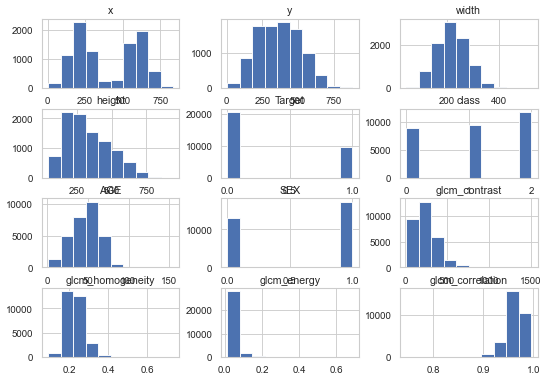

In [49]:
ax= plt.figure(figsize=(10,7),dpi=64)
info_df.hist(ax=ax)

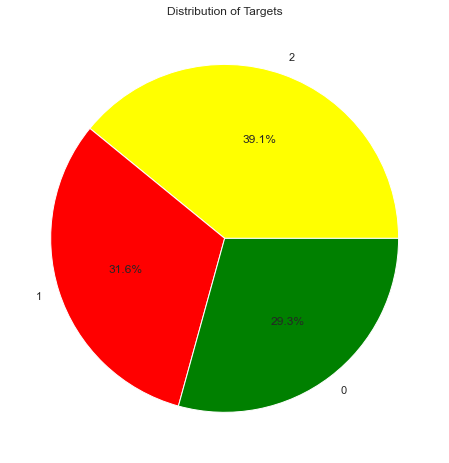

In [50]:
# Assuming df is your DataFrame containing the 'Target' column
target_counts = info_df['class'].value_counts()

# Plotting the distribution as a pie chart
plt.figure(figsize=(8, 8))
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', colors=['yellow', 'red','green'])
plt.title('Distribution of Targets')
plt.show()

<AxesSubplot:xlabel='x', ylabel='width'>

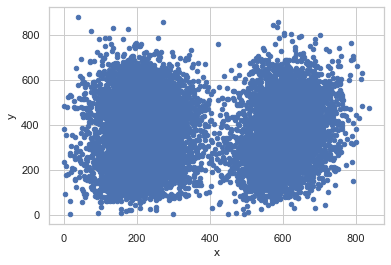

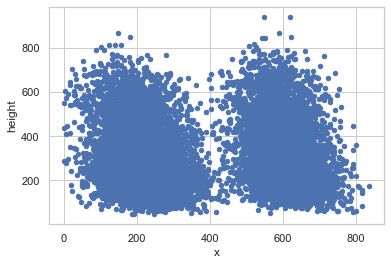

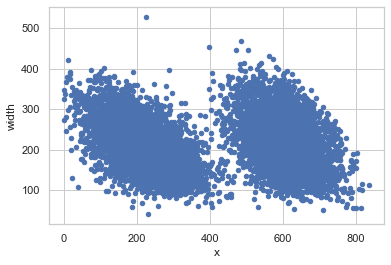

In [51]:
pos_bbox = info_df.query('Target==1')
pos_bbox.plot.scatter(x='x', y='y')
pos_bbox.plot.scatter(x='x', y='height')
pos_bbox.plot.scatter(x='x', y='width')

<Figure size 144x144 with 0 Axes>

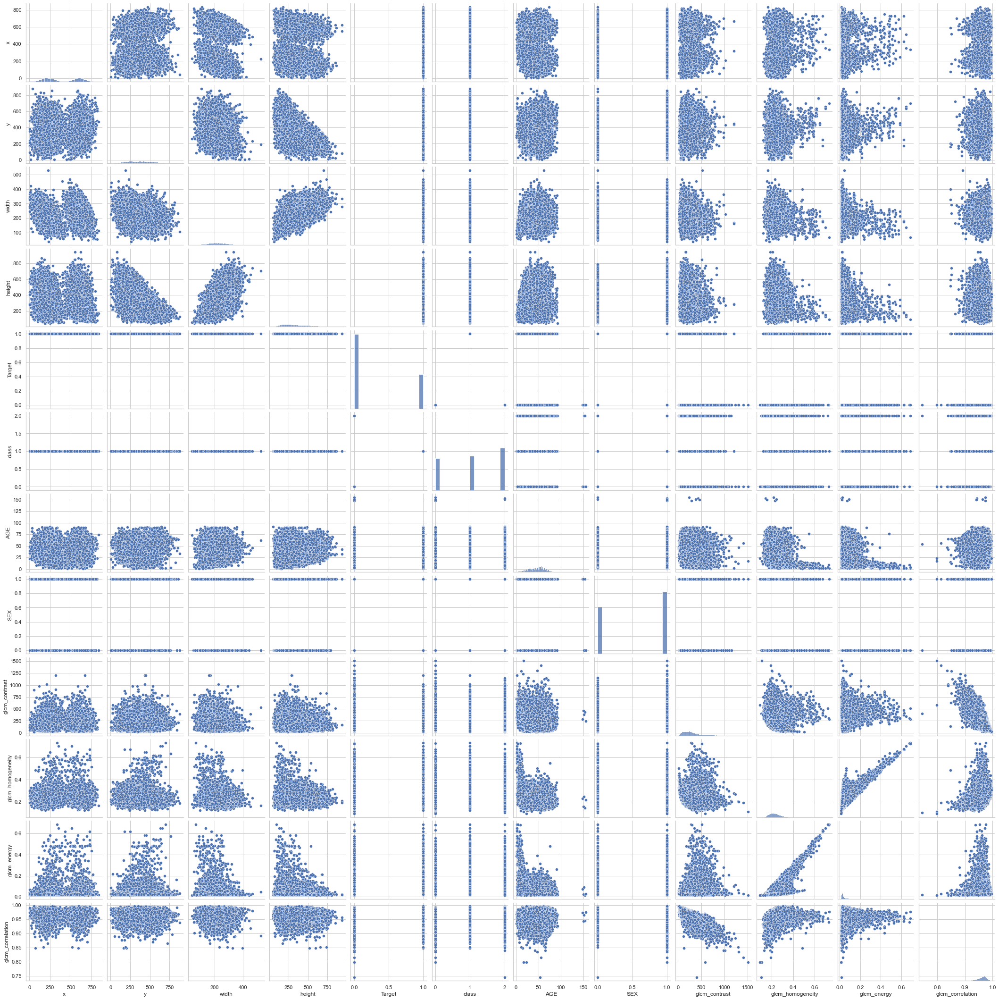

In [52]:
plt.figure(figsize=(2,2))
sns.pairplot(data=info_df)

In [53]:
def agetocatagory(age):
    age = int(age)
    if age >= 1 and age <= 13:
        return 'child'
    elif age >= 14 and age <=19:
        return 'teenage'
    elif age >=20 and age <=45:
        return 'Young'
    elif age >=46 and age <=60:
        return 'old'
    elif age >=61:
        return 'vold'


In [54]:
info_df['agecat'] =''

info_df['agecat'] = info_df['AGE'].apply(agetocatagory)

In [55]:
#for checkign based on target and sex wise age catagory
info_df.groupby(['Target','SEX'])['agecat'].value_counts()

Target  SEX  agecat 
0       0    Young      3410
             old        3240
             vold       1916
             teenage     252
             child       198
        1    old        4109
             Young      4009
             vold       2802
             teenage     451
             child       285
1       0    Young      1488
             old        1405
             vold        812
             child       147
             teenage     143
        1    Young      2246
             old        1735
             vold       1122
             teenage     248
             child       209
Name: agecat, dtype: int64

Text(0.5, 1.0, 'Relationship Between age catagory and Target')

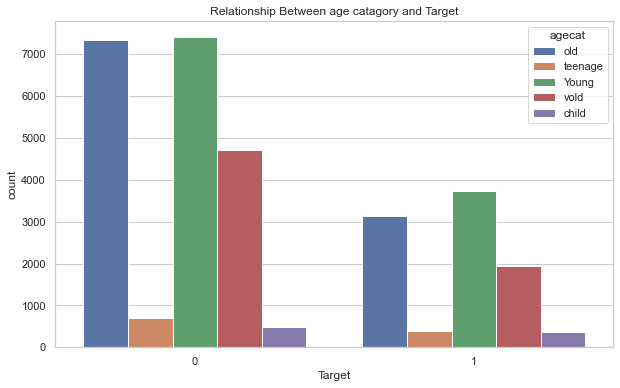

In [56]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Target', hue='agecat', data=info_df)
plt.title('Relationship Between age catagory and Target')

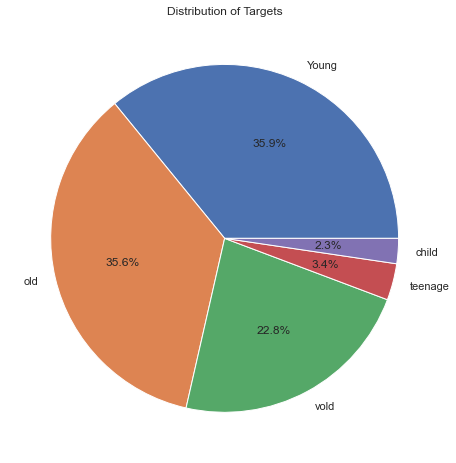

In [57]:
# Assuming df is your DataFrame containing the 'Target' column
target_counts = info_df.query('Target ==0')['agecat'].value_counts()

# Plotting the distribution as a pie chart
plt.figure(figsize=(8, 8))
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%')
plt.title('Distribution of Targets')
plt.show()

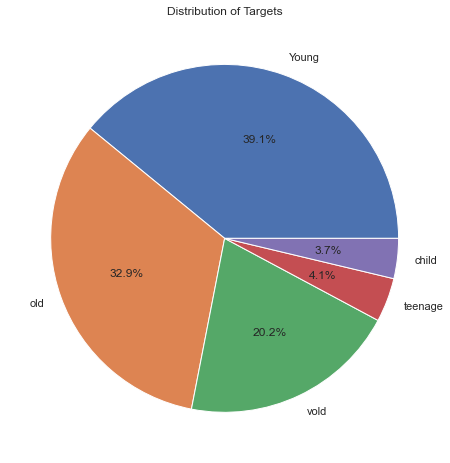

In [58]:
target_counts = info_df.query('Target ==1')['agecat'].value_counts()

# Plotting the distribution as a pie chart
plt.figure(figsize=(8, 8))
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%')
plt.title('Distribution of Targets')
plt.show()

### Model Building for classification

In [59]:
size = 256
info_df_256 = info_df.copy()

In [60]:
info_df_256['x'] = info_df_256['x'].apply(calculatetheimageboundings)
info_df_256['y'] = info_df_256['y'].apply(calculatetheimageboundings)
info_df_256['width'] = info_df_256['width'].apply(calculatetheimageboundings)
info_df_256['height'] = info_df_256['height'].apply(calculatetheimageboundings)
info_df_256

,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation,agecat
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,2,51,0,PA,CHEST,240.363107,0.221791,0.041201,0.977566,old
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,2,48,0,PA,CHEST,52.810114,0.333943,0.077472,0.983760,old
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,2,19,1,AP,CHEST,220.881035,0.200721,0.025836,0.968193,teenage
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,0,28,1,PA,CHEST,406.426794,0.165048,0.019650,0.954598,Young
4,00436515-870c-4b36-a041-de91049b9ab4,66.0,38.0,53.0,94.0,1,1,32,0,AP,CHEST,86.499986,0.236534,0.020687,0.986255,Young
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,46.0,74.0,57.0,94.0,1,1,54,1,AP,CHEST,251.202459,0.243280,0.057668,0.932018,old
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,0,46,0,PA,CHEST,139.894010,0.238966,0.074233,0.985241,old
30224,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,0,45,1,PA,CHEST,325.506092,0.212639,0.023197,0.924871,Young
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,142.0,98.0,65.0,86.0,1,1,72,0,AP,CHEST,198.700831,0.227273,0.023604,0.973146,vold


In [61]:
#for getting just 1000 images from each classes
target_not_phe = info_df_256[info_df_256['class']==0].sample(1000)
target_not_phe_not_op =  info_df_256[info_df_256['class']==2].sample(1000)
target_phe =info_df_256[info_df_256['class']==1].sample(1000)


In [62]:
combine_model_df_1k = pd.concat([target_not_phe,target_phe,target_not_phe_not_op],axis=0)

combine_model_df_1k.reset_index(drop=True)
combine_model_df_1k

,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation,agecat
17269,a551cd16-3064-4204-8410-86831370ad61,NaN,NaN,NaN,NaN,0,0,50,1,PA,CHEST,306.593503,0.174920,0.019247,0.948594,old
24083,d87efba3-87d4-4f09-95a0-f927a1a22df7,NaN,NaN,NaN,NaN,0,0,39,1,PA,CHEST,215.309888,0.174258,0.019767,0.941859,Young
6519,4f843afa-f88f-4a85-8365-87ab781fae79,NaN,NaN,NaN,NaN,0,0,59,1,PA,CHEST,390.651282,0.155675,0.016292,0.947248,old
193,05d3b194-78bb-4fe9-aa1c-0f1d76e5641d,NaN,NaN,NaN,NaN,0,0,45,0,PA,CHEST,434.578427,0.223216,0.087301,0.951282,Young
2454,320e8587-ab3c-47d0-9a89-fcc2f5cb5c95,NaN,NaN,NaN,NaN,0,0,42,1,PA,CHEST,214.158519,0.196748,0.047265,0.977092,Young
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13088,8413612c-f9e8-42de-b3a3-bb636a6f0730,NaN,NaN,NaN,NaN,0,2,55,0,AP,CHEST,247.435742,0.294478,0.034365,0.963647,old
22043,c7b538c8-e32c-446b-bc21-49b7decacd84,NaN,NaN,NaN,NaN,0,2,52,0,PA,CHEST,783.892339,0.206074,0.036035,0.920074,old
20992,beaac9d6-d4b5-474f-9e32-06655242e973,NaN,NaN,NaN,NaN,0,2,47,1,PA,CHEST,283.473674,0.202902,0.022334,0.964803,old
5725,4923a208-0341-4b6f-b355-3c537a3fd7d1,NaN,NaN,NaN,NaN,0,2,65,1,PA,CHEST,405.186756,0.193284,0.018976,0.953590,vold


In [63]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential,Model 
from tensorflow.keras.layers import Conv2D,GlobalAveragePooling2D ,MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping


In [64]:
# Define image dimensions and batch size
img_width, img_height = 256, 256
batch_size = 32

# Define the directory where the images are stored
image_directory = 'train_images/images_256_jpg'

In [65]:

# Assuming combine_model_df_1k contains the dataset with patientId and corresponding labels



# Convert numerical class labels to string representations
combine_model_df_1k['class'] = combine_model_df_1k['class'].astype(str)
combine_model_df_1k['patientId'] = combine_model_df_1k['patientId'] + '.jpg'
# Split the dataset into training and validation sets
train_df, val_df = train_test_split(combine_model_df_1k, test_size=0.2, random_state=77)
epocs_count = 25

datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_dataframe(
    dataframe=val_df,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)



model_cnn_1 = Sequential()
model_cnn_1.add(Conv2D(9,(3,3),activation='relu',input_shape = (img_width,img_height,1)))
model_cnn_1.add(MaxPooling2D((2,2)))

model_cnn_1.add(Conv2D(16,(3,3),activation='relu'))
model_cnn_1.add(MaxPooling2D((2,2)))

model_cnn_1.add(Conv2D(32,(3,3),activation='relu'))
model_cnn_1.add(MaxPooling2D((2,2)))

# model_cnn_1.add(GlobalAveragePooling2D())

model_cnn_1.add(Flatten())

model_cnn_1.add(Dense(128,activation='relu'))
model_cnn_1.add(Dropout(0.4))

model_cnn_1.add(Dense(64,activation='relu'))
model_cnn_1.add(Dropout(0.5))

model_cnn_1.add(Dense(3,activation='softmax'))

# Compile the model_cnn_1
model_cnn_1.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Use categorical cross-entropy for multi-class classification
              metrics=['accuracy'],)

# Define callbacks
checkpoint = ModelCheckpoint("best_model.h5", monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, verbose=1, restore_best_weights=True)

# Train the model
history = model_cnn_1.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=epocs_count,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    callbacks=[checkpoint, early_stopping]
)


Found 1920 validated image filenames belonging to 3 classes.
Found 120 validated image filenames belonging to 3 classes.
Epoch 1/25
60/60 [==============================] - ETA: 0s - loss: 1.1098 - accuracy: 0.3865
Epoch 1: val_accuracy improved from -inf to 0.66667, saving model to best_model.h5
60/60 [==============================] - 38s 543ms/step - loss: 1.1098 - accuracy: 0.3865 - val_loss: 0.9685 - val_accuracy: 0.6667
Epoch 2/25
60/60 [==============================] - ETA: 0s - loss: 0.9645 - accuracy: 0.5245
Epoch 2: val_accuracy did not improve from 0.66667
60/60 [==============================] - 3s 49ms/step - loss: 0.9645 - accuracy: 0.5245 - val_loss: 0.9076 - val_accuracy: 0.5833
Epoch 3/25
59/60 [============================>.] - ETA: 0s - loss: 0.9272 - accuracy: 0.5514
Epoch 3: val_accuracy did not improve from 0.66667
60/60 [==============================] - 3s 48ms/step - loss: 0.9277 - accuracy: 0.5495 - val_loss: 0.9207 - val_accuracy: 0.5625
Epoch 4/25
60/60 [==

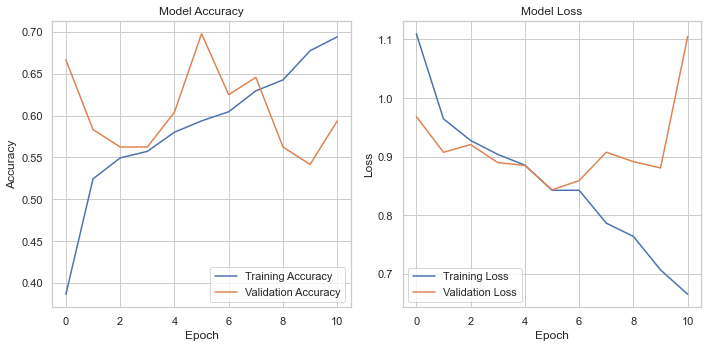

In [66]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create separate plots for accuracy and loss
plt.figure(figsize=(10, 5))

# Accuracy plot
plt.subplot(121)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(122)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [67]:
#for getting just 2000 images from each classes
target_not_phe = info_df_256[info_df_256['class']==0].sample(2000)
target_not_phe_not_op =  info_df_256[info_df_256['class']==2].sample(2000)
target_phe =info_df_256[info_df_256['class']==1].sample(2000)


In [68]:
combine_model_df_2k = pd.concat([target_not_phe,target_phe,target_not_phe_not_op],axis=0)
combine_model_df_2k.reset_index(drop=True)
combine_model_df_2k

,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation,agecat
502,08226aab-e8d2-401f-8b8d-1a2a51234c42,NaN,NaN,NaN,NaN,0,0,47,1,PA,CHEST,266.354325,0.183644,0.027495,0.970958,old
21412,c3146b7e-b141-4f08-84f2-e9c8d88674df,NaN,NaN,NaN,NaN,0,0,74,1,PA,CHEST,175.901242,0.213648,0.023234,0.965742,vold
14525,8f66472e-29c1-4dc5-86d7-8e0fa67e9f74,NaN,NaN,NaN,NaN,0,0,47,1,PA,CHEST,200.984357,0.174193,0.019557,0.954713,old
24098,d8adf370-83b9-4852-bedd-6e180fb95d9b,NaN,NaN,NaN,NaN,0,0,68,1,PA,CHEST,471.939189,0.210893,0.021338,0.941308,vold
12842,820a9541-f7cf-4b39-ab04-6d1befbd0835,NaN,NaN,NaN,NaN,0,0,67,1,AP,CHEST,214.742998,0.285640,0.038926,0.964955,vold
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4657,405fc22f-ea3f-481e-bb8e-b6b75ce9b916,NaN,NaN,NaN,NaN,0,2,28,0,PA,CHEST,194.378827,0.217663,0.046316,0.981116,Young
5827,49f711da-4bb0-4309-aeac-d18fbfa83f98,NaN,NaN,NaN,NaN,0,2,76,0,PA,CHEST,522.260975,0.278276,0.053782,0.950705,vold
15437,96ed9839-9487-4700-bff1-d56aca5c00e2,NaN,NaN,NaN,NaN,0,2,72,1,AP,CHEST,80.921843,0.264735,0.028101,0.976821,vold
25876,e7488964-cda3-45b3-8dac-52c21148ff29,NaN,NaN,NaN,NaN,0,2,28,1,AP,CHEST,106.707369,0.246364,0.025374,0.976472,Young


In [69]:
combine_model_df_2k['class'] = combine_model_df_2k['class'].astype(str)
combine_model_df_2k['patientId'] = combine_model_df_2k['patientId'] + '.jpg'
# Split the dataset into training and validation sets
train_df2, val_df2 = train_test_split(combine_model_df_2k, test_size=0.2, random_state=77)
epocs_count = 30

datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = datagen.flow_from_dataframe(
    dataframe=train_df2,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_dataframe(
    dataframe=val_df2,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)



model_cnn_2_k256 = Sequential()
model_cnn_2_k256.add(Conv2D(9,(3,3),activation='relu',input_shape = (img_width,img_height,1)))
model_cnn_2_k256.add(MaxPooling2D((2,2)))

model_cnn_2_k256.add(Conv2D(16,(3,3),activation='relu'))
model_cnn_2_k256.add(MaxPooling2D((2,2)))

model_cnn_2_k256.add(Conv2D(8,(3,3),activation='relu'))
model_cnn_2_k256.add(MaxPooling2D((2,2)))


model_cnn_2_k256.add(Flatten())

model_cnn_2_k256.add(Dense(64,activation='relu'))
model_cnn_2_k256.add(Dropout(0.5))

model_cnn_2_k256.add(Dense(16,activation='relu'))

model_cnn_2_k256.add(Dense(3,activation='softmax'))

# Compile the model_cnn_2_k256
model_cnn_2_k256.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Use categorical cross-entropy for multi-class classification
              metrics=['accuracy'],)

# Define callbacks
checkpoint = ModelCheckpoint("best_model.h5", monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
early_stopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, restore_best_weights=True)

# Train the model
history = model_cnn_2_k256.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=epocs_count,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    callbacks=[checkpoint, early_stopping]
)

Found 3840 validated image filenames belonging to 3 classes.
Found 240 validated image filenames belonging to 3 classes.
Epoch 1/30
120/120 [==============================] - ETA: 0s - loss: 1.0239 - accuracy: 0.4599
Epoch 1: val_accuracy improved from -inf to 0.57143, saving model to best_model.h5
120/120 [==============================] - 58s 481ms/step - loss: 1.0239 - accuracy: 0.4599 - val_loss: 0.9141 - val_accuracy: 0.5714
Epoch 2/30
120/120 [==============================] - ETA: 0s - loss: 0.9271 - accuracy: 0.5562
Epoch 2: val_accuracy improved from 0.57143 to 0.61161, saving model to best_model.h5
120/120 [==============================] - 6s 48ms/step - loss: 0.9271 - accuracy: 0.5562 - val_loss: 0.8435 - val_accuracy: 0.6116
Epoch 3/30
119/120 [============================>.] - ETA: 0s - loss: 0.8996 - accuracy: 0.5646
Epoch 3: val_accuracy did not improve from 0.61161
120/120 [==============================] - 6s 46ms/step - loss: 0.8993 - accuracy: 0.5646 - val_loss: 0.8

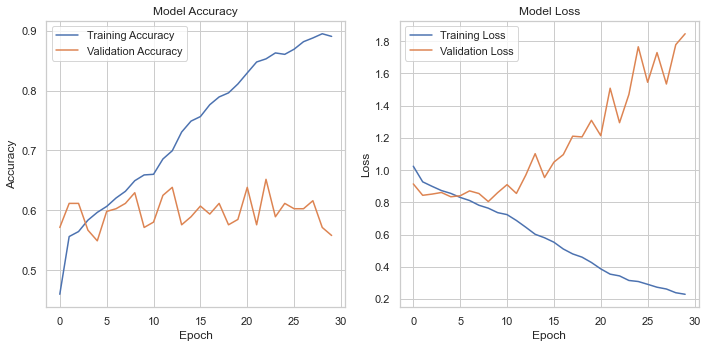

In [70]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create separate plots for accuracy and loss
plt.figure(figsize=(10, 5))

# Accuracy plot
plt.subplot(121)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(122)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [71]:
#for getting just 3000 images from each classes
target_not_phe = info_df_256[info_df_256['class']==0].sample(3000)
target_not_phe_not_op =  info_df_256[info_df_256['class']==2].sample(3000)
target_phe =info_df_256[info_df_256['class']==1].sample(3000)



combine_model_df_3k = pd.concat([target_not_phe,target_phe,target_not_phe_not_op],axis=0)
combine_model_df_3k.reset_index(drop=True)
combine_model_df_3k

,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation,agecat
9027,6452c673-1a45-429a-a2ca-df17ca4ec27e,NaN,NaN,NaN,NaN,0,0,47,1,PA,CHEST,321.024737,0.179758,0.026578,0.966599,old
6028,4b912423-ef5e-45c9-90a3-b04fc7977653,NaN,NaN,NaN,NaN,0,0,56,1,PA,CHEST,248.959226,0.165675,0.017055,0.969842,old
25541,e4cd65ae-65de-44fc-a6b2-ebbc46d2e8d8,NaN,NaN,NaN,NaN,0,0,46,0,PA,CHEST,518.154554,0.202925,0.024782,0.929619,old
16383,9ea1cddd-4382-414d-809a-2364d508c569,NaN,NaN,NaN,NaN,0,0,52,0,PA,CHEST,310.744266,0.205751,0.023469,0.969094,old
12200,7cf7f5f9-ee16-49a1-86ea-ec7c7e2b9956,NaN,NaN,NaN,NaN,0,0,49,1,PA,CHEST,453.555534,0.169285,0.016910,0.949616,old
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28283,fa6f2444-e397-47d7-aa38-60302c4b454b,NaN,NaN,NaN,NaN,0,2,49,1,PA,CHEST,277.707292,0.172032,0.020459,0.968026,old
22167,c8a6b62b-8f1e-4b58-9df1-0892a4910bcd,NaN,NaN,NaN,NaN,0,2,52,1,PA,CHEST,244.810896,0.199665,0.029163,0.972565,old
11651,789e0f7e-a921-4957-a784-e4766b77a99b,NaN,NaN,NaN,NaN,0,2,61,0,PA,CHEST,67.679147,0.294047,0.034462,0.973103,vold
22742,cd378513-15c9-4d85-a7f5-57ed6a36bbd4,NaN,NaN,NaN,NaN,0,2,69,1,AP,CHEST,72.506128,0.241748,0.023241,0.977788,vold


In [72]:
combine_model_df_3k['class'] = combine_model_df_3k['class'].astype(str)
combine_model_df_3k['patientId'] = combine_model_df_3k['patientId'] + '.jpg'
# Split the dataset into training and validation sets
train_df3, val_df3 = train_test_split(combine_model_df_3k, test_size=0.2, random_state=77)
epocs_count = 30

datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_generator = datagen.flow_from_dataframe(
    dataframe=train_df3,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

validation_generator = datagen.flow_from_dataframe(
    dataframe=val_df3,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)



model_cnn256_3k = Sequential()
model_cnn256_3k.add(Conv2D(9,(3,3),activation='relu',input_shape = (img_width,img_height,1)))
model_cnn256_3k.add(MaxPooling2D((2,2)))

model_cnn256_3k.add(Conv2D(16,(3,3),activation='relu'))
model_cnn256_3k.add(MaxPooling2D((2,2)))

model_cnn256_3k.add(Conv2D(32,(3,3),activation='relu'))
model_cnn256_3k.add(MaxPooling2D((2,2)))


model_cnn256_3k.add(Flatten())

model_cnn256_3k.add(Dense(64,activation='relu'))
model_cnn256_3k.add(Dropout(0.5))

model_cnn256_3k.add(Dense(32,activation='relu'))

model_cnn256_3k.add(Dense(3,activation='softmax'))

# Compile the model_cnn256_3k
model_cnn256_3k.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Use categorical cross-entropy for multi-class classification
              metrics=['accuracy'],)

# Define callbacks
checkpoint = ModelCheckpoint("best_model.h5", monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
early_stopping = EarlyStopping(monitor='val_accuracy', patience=15, verbose=1, restore_best_weights=True)

# Train the model
history = model_cnn256_3k.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    epochs=epocs_count,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // batch_size,
    callbacks=[checkpoint, early_stopping]
)

Found 5760 validated image filenames belonging to 3 classes.
Found 360 validated image filenames belonging to 3 classes.
Epoch 1/30
180/180 [==============================] - ETA: 0s - loss: 0.9765 - accuracy: 0.5099
Epoch 1: val_accuracy improved from -inf to 0.60227, saving model to best_model.h5
180/180 [==============================] - 76s 420ms/step - loss: 0.9765 - accuracy: 0.5099 - val_loss: 0.8745 - val_accuracy: 0.6023
Epoch 2/30
180/180 [==============================] - ETA: 0s - loss: 0.8905 - accuracy: 0.5698
Epoch 2: val_accuracy improved from 0.60227 to 0.61932, saving model to best_model.h5
180/180 [==============================] - 9s 48ms/step - loss: 0.8905 - accuracy: 0.5698 - val_loss: 0.8238 - val_accuracy: 0.6193
Epoch 3/30
180/180 [==============================] - ETA: 0s - loss: 0.8641 - accuracy: 0.5903
Epoch 3: val_accuracy did not improve from 0.61932
180/180 [==============================] - 9s 47ms/step - loss: 0.8641 - accuracy: 0.5903 - val_loss: 0.8

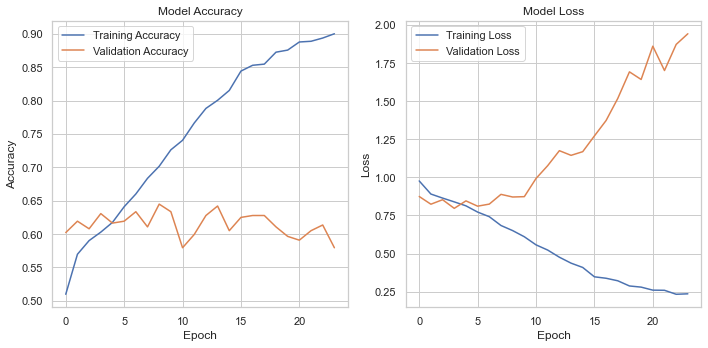

In [73]:
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Create separate plots for accuracy and loss
plt.figure(figsize=(10, 5))

# Accuracy plot
plt.subplot(121)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(122)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

12/12 [==============================] - 1s 55ms/step - loss: 0.8688 - accuracy: 0.6500
Validation Accuracy: 0.6499999761581421
Precision: 0.32223111708750435
Recall: 0.32222222222222224
F1 Score: 0.3220422408842951


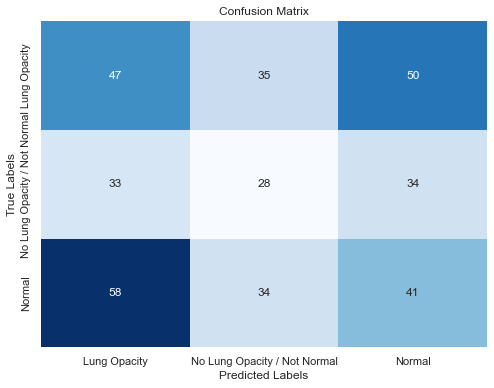

In [74]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score



# Evaluate the model_cnn256_3k on the validation dataset
val_loss, val_accuracy = model_cnn256_3k.evaluate(validation_generator, steps=12)
# Predict probabilities for the validation set
val_predictions = model_cnn256_3k.predict(validation_generator, steps=12)
# Convert probabilities to class labels
val_pred_labels = np.argmax(val_predictions, axis=1)
val_true_labels = validation_generator.classes
# Calculate precision, recall, and F1 score manually
precision = precision_score(val_true_labels, val_pred_labels, average='weighted')
recall = recall_score(val_true_labels, val_pred_labels, average='weighted')
f1 = f1_score(val_true_labels, val_pred_labels, average='weighted')


print("Validation Accuracy:", val_accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)



# Calculate confusion matrix
cm = confusion_matrix(val_true_labels, val_pred_labels)
# Class mapping provided
#class_mapping = val_generator.class_indices
class_mapping = {'Lung Opacity': 0, 'No Lung Opacity / Not Normal': 1, 'Normal': 2}
# Plot confusion matrix with numerical values and categorical labels
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_mapping.keys(), yticklabels=class_mapping.keys())
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


For more we can do transfer learning with existing models like resnet , vgg , yolo , mobile net for batter accuracy and identification through deep learning .


In [75]:
info_df_128 = pd.read_csv('infodf.csv')
size = 128
info_df_128['x'] = info_df_128['x'].apply(calculatetheimageboundings)
info_df_128['y'] = info_df_128['y'].apply(calculatetheimageboundings)
info_df_128['width'] = info_df_128['width'].apply(calculatetheimageboundings)
info_df_128['height'] = info_df_128['height'].apply(calculatetheimageboundings)
info_df_128

,Unnamed: 0,patientId,x,y,width,height,Target,class,AGE,SEX,ViewPosition,BodyPart,glcm_contrast,glcm_homogeneity,glcm_energy,glcm_correlation
0,0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,2,51,0,PA,CHEST,240.363107,0.221791,0.041201,0.977566
1,1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,2,48,0,PA,CHEST,52.810114,0.333943,0.077472,0.983760
2,2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,2,19,1,AP,CHEST,220.881035,0.200721,0.025836,0.968193
3,3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,0,28,1,PA,CHEST,406.426794,0.165048,0.019650,0.954598
4,4,00436515-870c-4b36-a041-de91049b9ab4,33.0,19.0,26.0,47.0,1,1,32,0,AP,CHEST,86.499986,0.236534,0.020687,0.986255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30222,37621,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,23.0,37.0,28.0,47.0,1,1,54,1,AP,CHEST,251.202459,0.243280,0.057668,0.932018
30223,37623,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0,0,46,0,PA,CHEST,139.894010,0.238966,0.074233,0.985241
30224,37624,c1f6b555-2eb1-4231-98f6-50a963976431,NaN,NaN,NaN,NaN,0,0,45,1,PA,CHEST,325.506092,0.212639,0.023197,0.924871
30225,37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,71.0,49.0,32.0,43.0,1,1,72,0,AP,CHEST,198.700831,0.227273,0.023604,0.973146


In [76]:
# Define image dimensions and batch size
img_width, img_height = 128, 128
batch_size = 32

# Define the directory where the images are stored
image_directory = 'train_images/images_128_jpg'

In [77]:
#for getting just 1000 images from each classes
target_not_phe_100 = info_df_128[info_df_128['class']==0].sample(500)
target_phe_100 =info_df_128[info_df_128['class']==1].sample(500)
target_not_phe_not_op_100 =  info_df_128[info_df_128['class']==2].sample(500)



combine_model_df_100 = pd.concat([target_not_phe_100,target_phe_100,target_not_phe_not_op_100],axis=0)
combine_model_df_100.reset_index(drop=True)
# combine_model_df_100
Df_make_100 = combine_model_df_100[['patientId','class']].copy()
Df_make_100['patientId'] = Df_make_100['patientId'] +'.jpg'
Df_make_100['class'] = Df_make_100['class'].astype('str')
Df_make_100.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1500 entries, 845 to 11428
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   patientId  1500 non-null   object
 1   class      1500 non-null   object
dtypes: object(2)
memory usage: 35.2+ KB


### model for siamese network

In [78]:
import tensorflow as tf

In [96]:
train_df_100, val_df_100= train_test_split(Df_make_100, test_size=0.2, random_state=5)
epocs_count = 30

datagen = ImageDataGenerator(rescale=1./255)
datagen2 = ImageDataGenerator(rescale=1./255)

train_generator1 = datagen.flow_from_dataframe(
    dataframe=train_df_100,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    # subset='training',
    # shuffle = True,
    
    # seed=7
)

validation_generator1 = datagen2.flow_from_dataframe(
    dataframe=val_df_100,
    directory=image_directory,
    x_col="patientId",  # Use the column name for file paths
    y_col="class",      # Use the column name for labels
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    # subset='validation',
    # shuffle=True,
    
    # seed=7
)   


Found 1200 validated image filenames belonging to 3 classes.
Found 300 validated image filenames belonging to 3 classes.


In [97]:
x_train=np.concatenate([train_generator1.next()[0] for i in range(train_generator1.__len__())])
y_train=np.concatenate([train_generator1.next()[1] for i in range(train_generator1.__len__())])
print(x_train.shape)
print(y_train.shape)
    

(1200, 128, 128, 3)
(1200,)


In [98]:
x_val=np.concatenate([validation_generator1.next()[0] for i in range(validation_generator1.__len__())])
y_val=np.concatenate([validation_generator1.next()[1] for i in range(validation_generator1.__len__())])
print(x_val.shape)
print(y_val.shape)

(300, 128, 128, 3)
(300,)


In [99]:
datastore_1000 = [x_train,y_train,x_val,y_val]
np.save('datastorePne_1000.npy',np.array(datastore_1000,dtype='object'),allow_pickle=True)

In [100]:
x_train,y_train,x_val,y_val = np.load('datastorePne_1000.npy',allow_pickle=True)
print(x_train.shape,y_train.shape,x_val.shape,y_val.shape)

(1200, 128, 128, 3) (1200,) (300, 128, 128, 3) (300,)


In [101]:
import random
def make_pairs(x, y):
    """Creates a tuple containing image pairs with corresponding label.

    Arguments:
        x: List containing images, each index in this list corresponds to one image.
        y: List containing labels, each label with datatype of `int`.

    Returns:
        Tuple containing two numpy arrays as (pairs_of_samples, labels),
        where pairs_of_samples' shape is (2len(x), 2,n_features_dims) and
        labels are a binary array of shape (2len(x)).
    """

    num_classes = max(y) + 1
    digit_indices = [np.where(y == i)[0] for i in range(num_classes)]
   

    pairs = []
    labels = []

    for idx1 in range(len(x)):
        # add a matching example
        x1 = x[idx1]
        label1 = y[idx1]
        idx2 = random.choice(digit_indices[label1])
        x2 = x[idx2]

        pairs += [[x1, x2]]
        labels += [1]

        # add a non-matching example
        label2 = random.randint(0, num_classes - 1)
        while label2 == label1:
            label2 = random.randint(0, num_classes - 1)

        idx2 = random.choice(digit_indices[label2])
        x2 = x[idx2]

        pairs += [[x1, x2]]
        labels += [0]

    return np.array(pairs), np.array(labels).astype("float32")

In [102]:
# Initialize input values such as margin, input image size(height, width), epochs, batch_size and output classes for this example
epochs = 100
batch_size = 8
margin = 1  
output_classes =3
img_height = 128
img_width = 128

In [103]:
print(x_train.dtype)
print(x_val.dtype)

float32
float32


In [104]:

train_wholelabel = y_train.astype("uint8")
val_wholelabel = y_val.astype("uint8")

print(f'{train_wholelabel.dtype},{val_wholelabel.dtype}')

uint8,uint8


In [105]:
pairs_train, labels_train = make_pairs(x_train, train_wholelabel)

In [106]:
pairs_val, labels_val = make_pairs(x_val, val_wholelabel)

In [107]:
print(pairs_train.shape)
print(pairs_val.shape)
print(labels_train.shape)

(2400, 2, 128, 128, 3)
(600, 2, 128, 128, 3)
(2400,)


In [108]:
x_train_1 = pairs_train[:, 0]  
x_train_2 = pairs_train[:, 1]
print(x_train_1.shape)
print(x_train_2.shape)

(2400, 128, 128, 3)
(2400, 128, 128, 3)


In [109]:
x_val_1 = pairs_val[:, 0]  
x_val_2 = pairs_val[:, 1]
print(x_val_1.shape)
print(x_val_2.shape)

(600, 128, 128, 3)
(600, 128, 128, 3)


In [110]:
IMG_SHAPE = x_train_1.shape[1:]
IMG_SHAPE

(128, 128, 3)

In [111]:
# Measuring distance between two vectors(images)

def euclidean_distance(vects):
    """Find the Euclidean distance between two vectors.

    Arguments:
        vects: List containing two tensors of same length.

    Returns:
        Tensor containing euclidean distance
        (as floating point value) between vectors.
    """

    x, y = vects
    sum_square = tf.math.reduce_sum(tf.math.square(x - y), axis=1, keepdims=True)
    return tf.math.sqrt(tf.math.maximum(sum_square, tf.keras.backend.epsilon()))

In [112]:
# Defining the Model

inputx = tf.keras.Input(shape=IMG_SHAPE)
x = tf.keras.layers.BatchNormalization()(inputx)
x = tf.keras.layers.Conv2D(4, (5, 5), activation="tanh")(x)
x = tf.keras.layers.AveragePooling2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Conv2D(16, (5, 5), activation="tanh")(x)
x = tf.keras.layers.AveragePooling2D(pool_size=(2, 2))(x)
x = tf.keras.layers.Flatten()(x)

x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dense(output_classes, activation="tanh")(x)
embedding_network = tf.keras.Model(inputx, x)

In [113]:
input_1 = tf.keras.layers.Input(IMG_SHAPE)
input_2 = tf.keras.layers.Input(IMG_SHAPE)

""" As mentioned above, Siamese Network share weights between tower networks (sister networks). 
To allow this, we will use same embedding network for both tower networks. """

tower_1 = embedding_network(input_1)
tower_2 = embedding_network(input_2)

merge_layer = tf.keras.layers.Lambda(euclidean_distance)([tower_1, tower_2])
normal_layer = tf.keras.layers.BatchNormalization()(merge_layer)
output_layer = tf.keras.layers.Dense(1, activation="sigmoid")(normal_layer)
siamese = tf.keras.Model(inputs=[input_1, input_2], outputs=output_layer)

In [114]:
# Loss Function

def loss(margin=1):
    """Provides 'contrastive_loss' an enclosing scope with variable 'margin'.

  Arguments:
      margin: Integer, defines the baseline for distance for which pairs
              should be classified as dissimilar. - (default is 1).

  Returns:
      'contrastive_loss' function with data ('margin') attached.
  """

    # Contrastive loss = mean( (1-true_value) * square(prediction) +
    #                         true_value * square( max(margin-prediction, 0) ))
    def contrastive_loss(y_true, y_pred):
        """Calculates the contrastive loss.

      Arguments:
          y_true: List of labels, each label is of type float32.
          y_pred: List of predictions of same length as of y_true,
                  each label is of type float32.

      Returns:
          A tensor containing contrastive loss as floating point value.
      """

        square_pred = tf.math.square(y_pred)
        margin_square = tf.math.square(tf.math.maximum(margin - (y_pred), 0))
        return tf.math.reduce_mean(
            (1 - y_true) * square_pred + (y_true) * margin_square
        )

    return contrastive_loss

In [115]:
siamese.compile(loss=loss(margin=margin), optimizer="RMSprop", metrics=["accuracy"])
siamese.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             (None, 3)            96127       ['input_2[0][0]',                
                                                                  'input_3[0][0]']          

In [116]:
history_siamese = siamese.fit(
    [x_train_1, x_train_2],
    labels_train,
    validation_data=([x_val_1, x_val_2], labels_val),
    batch_size=batch_size,
    epochs=epochs,
)

Epoch 1/100
300/300 [==============================] - 5s 14ms/step - loss: 0.2954 - accuracy: 0.5017 - val_loss: 0.2845 - val_accuracy: 0.5033
Epoch 2/100
300/300 [==============================] - 4s 12ms/step - loss: 0.2706 - accuracy: 0.5017 - val_loss: 0.2719 - val_accuracy: 0.4850
Epoch 3/100
300/300 [==============================] - 4s 12ms/step - loss: 0.2597 - accuracy: 0.5004 - val_loss: 0.2570 - val_accuracy: 0.4883
Epoch 4/100
300/300 [==============================] - 4s 12ms/step - loss: 0.2539 - accuracy: 0.4992 - val_loss: 0.2536 - val_accuracy: 0.4917
Epoch 5/100
300/300 [==============================] - 4s 12ms/step - loss: 0.2523 - accuracy: 0.4954 - val_loss: 0.2521 - val_accuracy: 0.4967
Epoch 6/100
300/300 [==============================] - 4s 12ms/step - loss: 0.2519 - accuracy: 0.4879 - val_loss: 0.2505 - val_accuracy: 0.4933
Epoch 7/100
300/300 [==============================] - 4s 12ms/step - loss: 0.2503 - accuracy: 0.5004 - val_loss: 0.2511 - val_accuracy:

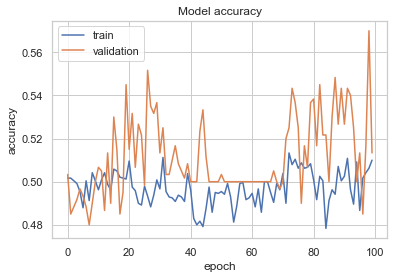

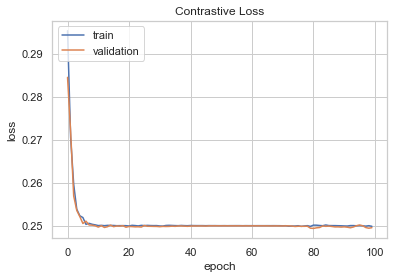

In [117]:
def plt_metric(history, metric, title, has_valid=True):
    """Plots the given 'metric' from 'history'.

    Arguments:
        history: history attribute of History object returned from Model.fit.
        metric: Metric to plot, a string value present as key in 'history'.
        title: A string to be used as title of plot.
        has_valid: Boolean, true if valid data was passed to Model.fit else false.

    Returns:
        None.
    """
    plt.plot(history[metric])
    if has_valid:
        plt.plot(history["val_" + metric])
        plt.legend(["train", "validation"], loc="upper left")
    plt.title(title)
    plt.ylabel(metric)
    plt.xlabel("epoch")
    plt.show()


# Plot the accuracy
plt_metric(history=history_siamese.history, metric="accuracy", title="Model accuracy")

# Plot the contrastive loss
plt_metric(history=history_siamese.history, metric="loss", title="Contrastive Loss")

In [118]:

results = siamese.evaluate([x_val_1, x_val_2], labels_val) #suppose is x_test_1
print("test loss, test acc:", results)

19/19 [==============================] - 1s 17ms/step - loss: 0.2496 - accuracy: 0.5133
test loss, test acc: [0.24957270920276642, 0.5133333206176758]


In [119]:
# Visualize the predicted model

def visualize(pairs, labels, to_show=6, num_col=3, predictions=None, test=False):
    """Creates a plot of pairs and labels, and prediction if it's test dataset.

    Arguments:
        pairs: Numpy Array, of pairs to visualize, having shape
               (Number of pairs, 2, 28, 28).
        to_show: Int, number of examples to visualize (default is 6)
                `to_show` must be an integral multiple of `num_col`.
                 Otherwise it will be trimmed if it is greater than num_col,
                 and incremented if if it is less then num_col.
        num_col: Int, number of images in one row - (default is 3)
                 For test and train respectively, it should not exceed 3 and 7.
        predictions: Numpy Array of predictions with shape (to_show, 1) -
                     (default is None)
                     Must be passed when test=True.
        test: Boolean telling whether the dataset being visualized is
              train dataset or test dataset - (default False).

    Returns:
        None.
    """

    # Define num_row
    # If to_show % num_col != 0
    #    trim to_show,
    #       to trim to_show limit num_row to the point where
    #       to_show % num_col == 0
    #
    # If to_show//num_col == 0
    #    then it means num_col is greater then to_show
    #    increment to_show
    #       to increment to_show set num_row to 1
    num_row = to_show // num_col if to_show // num_col != 0 else 1

    # `to_show` must be an integral multiple of `num_col`
    #  we found num_row and we have num_col
    #  to increment or decrement to_show
    #  to make it integral multiple of `num_col`
    #  simply set it equal to num_row * num_col
    to_show = num_row * num_col

    # Plot the images
    fig, axes = plt.subplots(num_row, num_col, figsize=(5, 5))
    for i in range(to_show):

        # If the number of rows is 1, the axes array is one-dimensional
        if num_row == 1:
            ax = axes[i % num_col]
        else:
            ax = axes[i // num_col, i % num_col]

        ax.imshow(tf.concat([pairs[i][0], pairs[i][1]], axis=1))
        ax.set_axis_off()
        if test:
            ax.set_title("True: {} | Pred: {:.5f}".format(labels[i], predictions[i][0]))
        else:
            ax.set_title("Label: {}".format(labels[i]))
    if test:
        plt.tight_layout(rect=(0, 0, 1.9, 1.9), w_pad=0.0)
    else:
        plt.tight_layout(rect=(0, 0, 1.5, 1.5))
    plt.show()

In [120]:
# Model Prediction
predictions = siamese.predict([x_val_1, x_val_2])

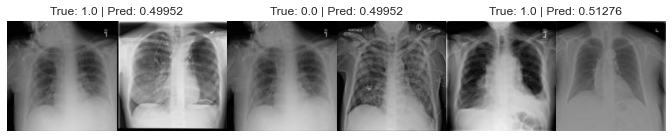

In [121]:
visualize(pairs_val, labels_val, to_show=3, predictions=predictions, test=True)

## Transfer learning VGG16 and RESNET 50

In [122]:
from keras.utils.np_utils import to_categorical   

categorical_labels_y = to_categorical(y_train, num_classes=3)

categorical_labels_y_val = to_categorical(y_val, num_classes=3)

In [123]:
## encoding the labels
from sklearn.preprocessing import LabelBinarizer
enc = LabelBinarizer()
y2 = enc.fit_transform(y_train)
y2

y2_val = enc.fit_transform(y_val)


In [18]:
# %pip install numba

Note: you may need to restart the kernel to use updated packages.


In [13]:
# from numba import cuda 
# device = cuda.get_current_device()
# device.reset()

In [ ]:
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
print(gpus)
if gpus: 
    tf.config.set_logical_device_configuration(
        gpus[0],
        [tf.config.LogicalDeviceConfiguration(memory_limit=5292)]
    )

logical_gpus = tf.config.list_logical_devices('GPU')
print(len(gpus), "Physical GPU,", len(logical_gpus), "Logical GPUs")

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

##VGGNet is a well-documented and globally used architecture for convolutional neural network
## Include_top=False to remove the classification layer that was trained on the ImageNet dataset and set the model as not trainable

base_model = VGG16(weights="imagenet", include_top=False, input_shape=x_train[0].shape)
base_model.trainable = False ## Not trainable weights

## Preprocessing input
train_ds = preprocess_input(x_train) 
train_val_df = preprocess_input(x_val)


In [ ]:
## Adding two hidden later and one softmax layer as an output layer
from tensorflow.keras import layers, models

flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(64, activation='relu')
dense_layer_2 = layers.Dense(32, activation='relu')
dense_layer_3 = layers.Dense(16, activation='relu')
prediction_layer = layers.Dense(3, activation='softmax')


cnn_VGG16_model1 = models.Sequential([
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    dense_layer_3,
    prediction_layer
])

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

cnn_VGG16_model1.compile(
    optimizer='Adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

## Early stopping whe validation accuracy does not change for 7 iteration 
es = EarlyStopping(monitor='val_accuracy', mode='auto', patience=7,  restore_best_weights=True)

#Trainign the model
history = cnn_VGG16_model1.fit(train_ds, y_train, epochs=50, validation_data=(train_val_df,y_val) ,callbacks=es)

Epoch 1/50


C:\AnacondaPython\envs\tensorflow\lib\site-packages\tensorflow\python\util\dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


375/375 [==============================] - 32s 68ms/step - loss: 0.6530 - accuracy: 0.3305 - val_loss: 0.6460 - val_accuracy: 0.3307
Epoch 2/50
375/375 [==============================] - 24s 64ms/step - loss: 0.6405 - accuracy: 0.3310 - val_loss: 0.6369 - val_accuracy: 0.3353
Epoch 3/50
375/375 [==============================] - 24s 64ms/step - loss: 0.6379 - accuracy: 0.3375 - val_loss: 0.6385 - val_accuracy: 0.3307
Epoch 4/50
375/375 [==============================] - 24s 65ms/step - loss: 0.6373 - accuracy: 0.3265 - val_loss: 0.6366 - val_accuracy: 0.3353
Epoch 5/50
375/375 [==============================] - 24s 65ms/step - loss: 0.6371 - accuracy: 0.3273 - val_loss: 0.6373 - val_accuracy: 0.3353
Epoch 6/50
375/375 [==============================] - 25s 66ms/step - loss: 0.6370 - accuracy: 0.3324 - val_loss: 0.6376 - val_accuracy: 0.3340
Epoch 7/50
375/375 [==============================] - 25s 66ms/step - loss: 0.6374 - accuracy: 0.3294 - val_loss: 0.6368 - val_accuracy: 0.3307
Epo

In [12]:
from tensorflow.keras.applications.resnet50 import ResNet50 
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping

resnet_base_model = ResNet50(include_top=False, weights='imagenet', input_shape=x_train[0].shape)
#model = VGG16(include_top=False, weights='imagenet', input_shape=(256,256,3))

train_ds = preprocess_input(x_train) 
train_val_df = preprocess_input(x_val)


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(50, activation='relu')
dense_layer_2 = layers.Dense(32, activation='relu')
prediction_layer = layers.Dense(3, activation='softmax')

cnn_resnet_model = models.Sequential([
    resnet_base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])



cnn_resnet_model.compile(
    optimizer='Adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=['accuracy'],
)
history =cnn_resnet_model.fit(train_ds, y_train, epochs=30, validation_data=(train_val_df,y_val))

Epoch 1/30


C:\AnacondaPython\envs\tensorflow\lib\site-packages\tensorflow\python\util\dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


38/38 [==============================] - 17s 202ms/step - loss: 0.8836 - accuracy: 0.3617 - val_loss: 20.1972 - val_accuracy: 0.3433
Epoch 2/30
38/38 [==============================] - 5s 139ms/step - loss: 0.6624 - accuracy: 0.3258 - val_loss: 0.6938 - val_accuracy: 0.3433
Epoch 3/30
38/38 [==============================] - 5s 137ms/step - loss: 0.6508 - accuracy: 0.3525 - val_loss: 0.6651 - val_accuracy: 0.3433
Epoch 4/30
38/38 [==============================] - 5s 141ms/step - loss: 0.6436 - accuracy: 0.3583 - val_loss: 0.6702 - val_accuracy: 0.3433
Epoch 5/30
38/38 [==============================] - 5s 141ms/step - loss: 0.6441 - accuracy: 0.3408 - val_loss: 0.6691 - val_accuracy: 0.3433
Epoch 6/30
38/38 [==============================] - 5s 142ms/step - loss: 0.6434 - accuracy: 0.3675 - val_loss: 0.6672 - val_accuracy: 0.3433
Epoch 7/30
38/38 [==============================] - 5s 141ms/step - loss: 0.6380 - accuracy: 0.3708 - val_loss: 0.6726 - val_accuracy: 0.3433
Epoch 8/30
38/3

In [4]:
from tensorflow.keras.applications.mobilenet import preprocess_input
import pydicom as dcm


images = []
ADJUSTED_IMAGE_SIZE = 128
imageList = []
classLabels = []
labels = []
originalImage = []
# Function to read the image from the path and reshape the image to size
def readAndReshapeImage(image):
    img = np.array(image).astype(np.uint8)
    ## Resize the image
    res = cv2.resize(img,(ADJUSTED_IMAGE_SIZE,ADJUSTED_IMAGE_SIZE), interpolation = cv2.INTER_LINEAR)
    return res

## Read the imahge and resize the image
def populateImage(rowData):
    for index, row in rowData.iterrows():
        patientId = row.patientId
        classlabel = row["class"]
        dcm_file = 'train_images\stage_2_train_images\\'+'{}.dcm'.format(patientId)
        dcm_data = dcm.read_file(dcm_file)
        img = dcm_data.pixel_array
        ## Converting the image to 3 channels as the dicom image pixel does not have colour classes wiht it
        if len(img.shape) != 3 or img.shape[2] != 3:
            img = np.stack((img,) * 3, -1)
        imageList.append(readAndReshapeImage(img))
#         originalImage.append(img)
        classLabels.append(classlabel)
    tmpImages = np.array(imageList)
    tmpLabels = np.array(classLabels)
#     originalImages = np.array(originalImage)
    return tmpImages,tmpLabels

In [5]:
labels = pd.read_csv("stage_2_train_labels.csv")
class_labels = pd.read_csv('stage_2_detailed_class_info.csv')
training_data = pd.concat([labels, class_labels['class']], axis = 1)
sample_trainigdata = training_data.groupby('class', group_keys=False).apply(lambda x: x.sample(1000))

In [6]:

images,labels = populateImage(sample_trainigdata)

In [7]:
from sklearn.preprocessing import LabelBinarizer
enc = LabelBinarizer()
y2 = enc.fit_transform(labels)

In [10]:
## splitting into train ,test and validation data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(images, y2, test_size=0.3, random_state=50)
X_test, X_val, y_test, y_val = train_test_split(X_test,y_test, test_size = 0.5, random_state=50)

In [11]:
## Creating a Copy
X_train1 = X_train.copy()
X_val1 = X_val.copy()
X_test1 = X_test.copy()

In [13]:
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping

##VGGNet is a well-documented and globally used architecture for convolutional neural network
## Include_top=False to remove the classification layer that was trained on the ImageNet dataset and set the model as not trainable

base_model = VGG16(weights="imagenet", include_top=False, input_shape=X_train[0].shape)
base_model.trainable = False ## Not trainable weights

## Preprocessing input
train_ds = preprocess_input(X_train1) 
train_val_df = preprocess_input(X_val1)


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(50, activation='relu')
dense_layer_2 = layers.Dense(20, activation='relu')
prediction_layer = layers.Dense(3, activation='softmax')


cnn_VGG16_model = models.Sequential([
    base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])


cnn_VGG16_model.compile(
    optimizer='Adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=['accuracy'],
)

## Early stopping whe validation accuracy does not change for 7 iteration 
es = EarlyStopping(monitor='val_accuracy', mode='auto', patience=7,  restore_best_weights=True)

#Trainign the model
history = cnn_VGG16_model.fit(train_ds, y_train, epochs=30, validation_data=(train_val_df,y_val) ,callbacks=es)

Epoch 1/30


C:\AnacondaPython\envs\tensorflow\lib\site-packages\tensorflow\python\util\dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


66/66 [==============================] - 10s 93ms/step - loss: 0.8521 - accuracy: 0.5648 - val_loss: 0.5803 - val_accuracy: 0.6467
Epoch 2/30
66/66 [==============================] - 4s 63ms/step - loss: 0.4586 - accuracy: 0.7033 - val_loss: 0.5100 - val_accuracy: 0.6778
Epoch 3/30
66/66 [==============================] - 4s 62ms/step - loss: 0.3428 - accuracy: 0.7757 - val_loss: 0.5701 - val_accuracy: 0.6400
Epoch 4/30
66/66 [==============================] - 4s 62ms/step - loss: 0.2639 - accuracy: 0.8376 - val_loss: 0.5628 - val_accuracy: 0.6622
Epoch 5/30
66/66 [==============================] - 4s 63ms/step - loss: 0.2190 - accuracy: 0.8743 - val_loss: 0.6210 - val_accuracy: 0.6467
Epoch 6/30
66/66 [==============================] - 4s 63ms/step - loss: 0.1813 - accuracy: 0.9057 - val_loss: 0.6583 - val_accuracy: 0.6733
Epoch 7/30
66/66 [==============================] - 4s 63ms/step - loss: 0.1427 - accuracy: 0.9290 - val_loss: 0.7098 - val_accuracy: 0.6511
Epoch 8/30
66/66 [=====

In [14]:
test_ds = preprocess_input(X_test1) 
fcl_loss, fcl_accuracy = cnn_VGG16_model.evaluate(test_ds, y_test, verbose=1)
print('Test loss:', fcl_loss)
print('Test accuracy:', fcl_accuracy)


15/15 [==============================] - 1s 47ms/step - loss: 0.5902 - accuracy: 0.6111
Test loss: 0.5902150869369507
Test accuracy: 0.6111111044883728


In [15]:
from tensorflow.keras.applications.resnet50 import ResNet50 
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping

resnet_base_model = ResNet50(include_top=False, weights='imagenet', input_shape=X_train[0].shape)
#model = VGG16(include_top=False, weights='imagenet', input_shape=(256,256,3))

train_ds = preprocess_input(X_train1) 
train_val_df = preprocess_input(X_val1)


flatten_layer = layers.Flatten()
dense_layer_1 = layers.Dense(50, activation='relu')
dense_layer_2 = layers.Dense(32, activation='relu')
prediction_layer = layers.Dense(3, activation='softmax')

cnn_resnet_model = models.Sequential([
    resnet_base_model,
    flatten_layer,
    dense_layer_1,
    dense_layer_2,
    prediction_layer
])


cnn_resnet_model.compile(
    optimizer='Adam',
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=['accuracy'],
)
history =cnn_resnet_model.fit(train_ds, y_train, epochs=30, validation_data=(train_val_df,y_val))

Epoch 1/30
66/66 [==============================] - 17s 164ms/step - loss: 0.6438 - accuracy: 0.5767 - val_loss: 23.1146 - val_accuracy: 0.3644
Epoch 2/30
66/66 [==============================] - 9s 133ms/step - loss: 0.4527 - accuracy: 0.6695 - val_loss: 28.1636 - val_accuracy: 0.3933
Epoch 3/30
66/66 [==============================] - 9s 134ms/step - loss: 0.4109 - accuracy: 0.7110 - val_loss: 1.5025 - val_accuracy: 0.6111
Epoch 4/30
66/66 [==============================] - 9s 134ms/step - loss: 0.3874 - accuracy: 0.7276 - val_loss: 5.5881 - val_accuracy: 0.4933
Epoch 5/30
66/66 [==============================] - 9s 135ms/step - loss: 0.3396 - accuracy: 0.7795 - val_loss: 0.5812 - val_accuracy: 0.5933
Epoch 6/30
66/66 [==============================] - 9s 136ms/step - loss: 0.2978 - accuracy: 0.8148 - val_loss: 0.7427 - val_accuracy: 0.5267
Epoch 7/30
66/66 [==============================] - 9s 136ms/step - loss: 0.2899 - accuracy: 0.8176 - val_loss: 3.7301 - val_accuracy: 0.5333
Epo

In [16]:
fcl_loss, fcl_accuracy = cnn_resnet_model.evaluate(test_ds, y_test, verbose=1)
print('Test loss:', fcl_loss)
print('Test accuracy:', fcl_accuracy)

15/15 [==============================] - 1s 38ms/step - loss: 1.6677 - accuracy: 0.6289
Test loss: 1.667738437652588
Test accuracy: 0.6288889050483704


## YOLO model implementation 

In [18]:
import os
import csv
import random
import pydicom
import numpy as np
import pandas as pd
from skimage import measure
from skimage.transform import resize
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
%matplotlib inline

In [19]:
pneumonia_locations = {}
# load table
with open(os.path.join('stage_2_train_labels.csv'),
          'r') as infile:
    # open reader
    reader = csv.reader(infile)
    # skip header
    next(reader, None)
    # loop through rows
    for rows in reader:
        # retrieve information
        filename = rows[0]
        location = rows[1:5]
        pneumonia = rows[5]
        # if row contains pneumonia add label to dictionary
        # which contains a list of pneumonia locations per filename
        if pneumonia == '1':
            # convert string to float to int
            location = [int(float(i)) for i in location]
            # save pneumonia location in dictionary
            if filename in pneumonia_locations:
                pneumonia_locations[filename].append(location)
            else:
                pneumonia_locations[filename] = [location]

**Data generator**

The dataset is too large to fit into memory, so we need to create a generator that loads data on the fly.

The generator takes in some filenames, batch_size and other parameters.

The generator outputs a random batch of numpy images and numpy masks.

In [20]:
# load and shuffle filenames
folder = 'train_images/stage_2_train_images'
filenames = os.listdir(folder)
random.shuffle(filenames)
# split into train and validation filenames
n_valid_samples = 2000
train_filenames = filenames[n_valid_samples:4000]
valid_filenames = filenames[:n_valid_samples]
print('n train samples', len(train_filenames))
print('n valid samples', len(valid_filenames))
n_train_samples = len(filenames) - n_valid_samples

n train samples 2000
n valid samples 2000


In [21]:
class generator(keras.utils.Sequence):    
    def __init__(self, folder, filenames, pneumonia_locations=None, batch_size=32, image_size=256, shuffle=True, augment=False, predict=False):
        self.folder = folder
        self.filenames = filenames
        self.pneumonia_locations = pneumonia_locations
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.augment = augment
        self.predict = predict
        self.on_epoch_end()
        
    def __load__(self, filename):
        # load dicom file as numpy array
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        # create empty mask
        msk = np.zeros(img.shape)
        # get filename without extension
        filename = filename.split('.')[0]
        # if image contains pneumonia
        if filename in self.pneumonia_locations:
            # loop through pneumonia
            for location in self.pneumonia_locations[filename]:
                # add 1's at the location of the pneumonia
                x, y, w, h = location
                msk[y:y+h, x:x+w] = 1
        # resize both image and mask
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        msk = resize(msk, (self.image_size, self.image_size), mode='reflect') > 0.5
        # if augment then horizontal flip half the time
        if self.augment and random.random() > 0.5:
            img = np.fliplr(img)
            msk = np.fliplr(msk)
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        msk = np.expand_dims(msk, -1)
        return img, msk
    
    def __loadpredict__(self, filename):
        # load dicom file as numpy array
        img = pydicom.dcmread(os.path.join(self.folder, filename)).pixel_array
        # resize image
        img = resize(img, (self.image_size, self.image_size), mode='reflect')
        # add trailing channel dimension
        img = np.expand_dims(img, -1)
        return img
        
    def __getitem__(self, index):
        # select batch
        filenames = self.filenames[index*self.batch_size:(index+1)*self.batch_size]
        # predict mode: return images and filenames
        if self.predict:
            # load files
            imgs = [self.__loadpredict__(filename) for filename in filenames]
            # create numpy batch
            imgs = np.array(imgs)
            return imgs, filenames
        # train mode: return images and masks
        else:
            # load files
            items = [self.__load__(filename) for filename in filenames]
            # unzip images and masks
            imgs, msks = zip(*items)
            # create numpy batch
            imgs = np.array(imgs)
            msks = np.array(msks)
            return imgs, msks
        
    def on_epoch_end(self):
        if self.shuffle:
            random.shuffle(self.filenames)
        
    def __len__(self):
        if self.predict:
            # return everything
            return int(np.ceil(len(self.filenames) / self.batch_size))
        else:
            # return full batches only
            return int(len(self.filenames) / self.batch_size)

In [22]:
# define iou or jaccard loss function
def iou_loss(y_true, y_pred):
    #print(y_true)
    y_true=tf.cast(y_true, tf.float32)
    y_pred=tf.cast(y_pred, tf.float32)
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])
   
    intersection = tf.reduce_sum(y_true * y_pred)
    score = (intersection + 1.) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection + 1.)
    return 1 - score

# combine bce loss and iou loss
def iou_bce_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) + 0.5 * iou_loss(y_true, y_pred)

# mean iou as a metric
def mean_iou(y_true, y_pred):
    y_pred = tf.round(y_pred)
    intersect = tf.reduce_sum(y_true * y_pred, axis=[1, 2, 3])
    union = tf.reduce_sum(y_true, axis=[1, 2, 3]) + tf.reduce_sum(y_pred, axis=[1, 2, 3])
    smooth = tf.ones(tf.shape(intersect))
    return tf.reduce_mean((intersect + smooth) / (union - intersect + smooth))

def create_downsample(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 1, padding='same', use_bias=False)(x)
    x = keras.layers.MaxPool2D(2)(x)
    return x

def create_resblock(channels, inputs):
    x = keras.layers.BatchNormalization(momentum=0.9)(inputs)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(x)
    return keras.layers.add([x, inputs])

def create_network(input_size, channels, n_blocks=2, depth=4):
    # input
    inputs = keras.Input(shape=(input_size, input_size, 1))
    x = keras.layers.Conv2D(channels, 3, padding='same', use_bias=False)(inputs)
    # residual blocks
    for d in range(depth):
        channels = channels * 2
        x = create_downsample(channels, x)
        for b in range(n_blocks):
            x = create_resblock(channels, x)
    # output
    x = keras.layers.BatchNormalization(momentum=0.9)(x)
    x = keras.layers.LeakyReLU(0)(x)
    x = keras.layers.Conv2D(1, 1, activation='sigmoid')(x)
    outputs = keras.layers.UpSampling2D(2**depth)(x)
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

In [23]:
BATCH_SIZE = 16
IMAGE_SIZE = 128

In [24]:
model = create_network(input_size=IMAGE_SIZE, channels=32, n_blocks=2, depth=4)
model.compile(optimizer='adam', loss=iou_bce_loss, metrics=['accuracy', mean_iou])

# cosine learning rate annealing
def cosine_annealing(x):
    lr = 0.0001
    epochs = 3
    return lr*(np.cos(np.pi*x/epochs)+1.)/2


learning_rate = tf.keras.callbacks.LearningRateScheduler(cosine_annealing)

# create train and validation generators
folder = 'train_images\\stage_2_train_images\\'
train_gen = generator(folder, train_filenames, pneumonia_locations, batch_size=BATCH_SIZE, 
                      image_size=IMAGE_SIZE, shuffle=True, augment=False, predict=False)
valid_gen = generator(folder, valid_filenames, pneumonia_locations, batch_size=BATCH_SIZE, 
                      image_size=IMAGE_SIZE, shuffle=False, predict=False)

print(model.summary())

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_66 (Conv2D)             (None, 128, 128, 32  288         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_63 (BatchN  (None, 128, 128, 32  128        ['conv2d_66[0][0]']              
 ormalization)                  )                                                           

In [25]:
EPOCHS=5
# MULTI_PROCESSING = True 

history = model.fit(train_gen, validation_data=valid_gen, callbacks=[learning_rate], epochs=EPOCHS)

Epoch 1/5
125/125 [==============================] - 445s 4s/step - loss: 0.5347 - accuracy: 0.9523 - mean_iou: 0.5635 - val_loss: 0.4880 - val_accuracy: 0.9713 - val_mean_iou: 0.7106 - lr: 1.0000e-04
Epoch 2/5
125/125 [==============================] - 315s 3s/step - loss: 0.4759 - accuracy: 0.9632 - mean_iou: 0.6686 - val_loss: 0.4665 - val_accuracy: 0.9655 - val_mean_iou: 0.7236 - lr: 7.5000e-05
Epoch 3/5
125/125 [==============================] - 308s 2s/step - loss: 0.4533 - accuracy: 0.9656 - mean_iou: 0.6945 - val_loss: 0.4606 - val_accuracy: 0.9630 - val_mean_iou: 0.6797 - lr: 2.5000e-05
Epoch 4/5
125/125 [==============================] - 311s 2s/step - loss: 0.4348 - accuracy: 0.9685 - mean_iou: 0.7154 - val_loss: 0.4569 - val_accuracy: 0.9681 - val_mean_iou: 0.7140 - lr: 0.0000e+00
Epoch 5/5
125/125 [==============================] - 313s 3s/step - loss: 0.4382 - accuracy: 0.9689 - mean_iou: 0.7224 - val_loss: 0.4579 - val_accuracy: 0.9630 - val_mean_iou: 0.6908 - lr: 2.5000

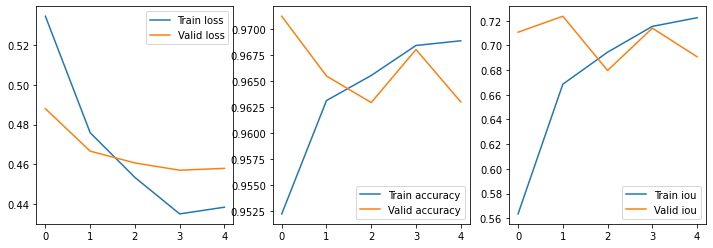

In [26]:
plt.figure(figsize=(12,4))
plt.subplot(131)
plt.plot(history.epoch, history.history["loss"], label="Train loss")
plt.plot(history.epoch, history.history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(history.epoch, history.history["accuracy"], label="Train accuracy")
plt.plot(history.epoch, history.history["val_accuracy"], label="Valid accuracy")
plt.legend()
plt.subplot(133)
plt.plot(history.epoch, history.history["mean_iou"], label="Train iou")
plt.plot(history.epoch, history.history["val_mean_iou"], label="Valid iou")
plt.legend()
plt.show()

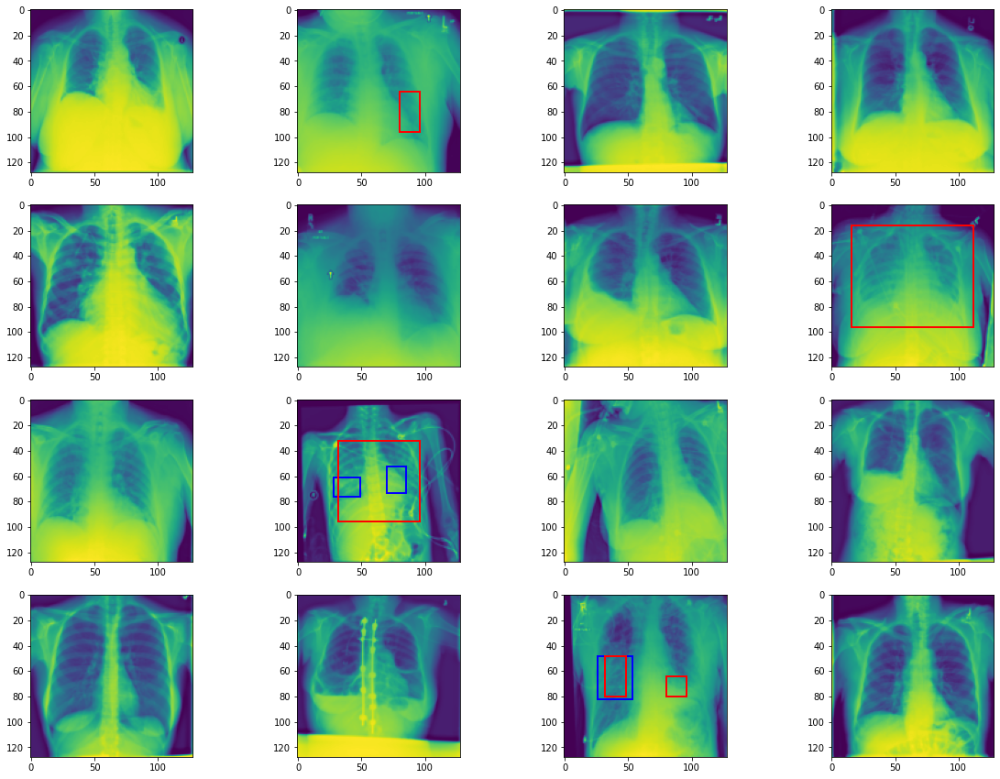

In [28]:
i=0
for imgs, msks in valid_gen:    
    # predict batch of images
    preds = model.predict(imgs)
    # create figure
    f, axarr = plt.subplots(4, 4, figsize=(20,15))
    axarr = axarr.ravel()
    axidx = 0
    # loop through batch
    for img, msk, pred in zip(imgs, msks, preds):
        i=i+1
        #exit after 32 images
        if i>16:
            break
        # plot image
        axarr[axidx].imshow(img[:, :, 0])
        # threshold true mask
        comp = msk[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,
                                                     edgecolor='b',facecolor='none'))
        # threshold predicted mask
        comp = pred[:, :, 0] > 0.5
        # apply connected components
        comp = measure.label(comp)
        # apply bounding boxes
        predictionString = ''
        for region in measure.regionprops(comp):
            # retrieve x, y, height and width
            y, x, y2, x2 = region.bbox
            height = y2 - y
            width = x2 - x
            axarr[axidx].add_patch(patches.Rectangle((x,y),width,height,linewidth=2,
                                                     edgecolor='r',facecolor='none'))
        axidx += 1
    plt.show()
    # only plot one batch
    break

## Mask-RCNN model 

In [1]:
!git clone https://github.com/kamlesh364/Mask-RCNN-TF2.7.0-keras2.7.0


Cloning into 'Mask-RCNN-TF2.7.0-keras2.7.0'...


In [1]:
%pip install imgaug

Note: you may need to restart the kernel to use updated packages.


In [2]:
ROOT_DIR = 'D://Learrning//great learning//capston Proj//dataset'
DATA_DIR = 'D://Learrning//great learning//capston Proj//dataset//train_images'
DATA_DIR_test = 'D://Learrning//great learning//capston Proj//dataset//test_images'


In [3]:
import os 
import sys
import random
import math
import numpy as np
import cv2
import matplotlib.pyplot as plt
import json
import pydicom
from imgaug import augmenters as iaa
from tqdm import tqdm
import pandas as pd 
import glob
from sklearn.model_selection import KFold
import tensorflow as tf
# Import Mask RCNN


In [4]:
sys.path.append(os.path.join(ROOT_DIR, 'Mask_RCNN'))  # To find local version of the library
from mrcnn.config import Config
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.model import log

In [5]:
train_dicom_dir = os.path.join(DATA_DIR, 'stage_2_train_images')
test_dicom_dir = os.path.join(DATA_DIR_test, 'stage_2_test_images')

download the file from " 
https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5

In [6]:


COCO_WEIGHTS_PATH = "D:\Learrning\great learning\capston Proj\dataset\mask_rcnn_coco.h5"

In [7]:
def get_dicom_fps(dicom_dir):
    dicom_fps = glob.glob(dicom_dir+'/'+'*.dcm')
    return list(set(dicom_fps))

def parse_dataset(dicom_dir, anns): 
    print(dicom_dir)
    image_fps = get_dicom_fps(dicom_dir)
    image_annotations = {fp: [] for fp in image_fps}
    for index, row in anns.iterrows(): 
        fp = os.path.join(dicom_dir, row['patientId']+'.dcm')
        image_annotations[fp].append(row)
    return image_fps, image_annotations 

In [8]:
# The following parameters have been selected to reduce running time for demonstration purposes 
# These are not optimal 

class DetectorConfig(Config):
    """Configuration for training pneumonia detection on the RSNA pneumonia dataset.
    Overrides values in the base Config class.
    """
    
    # Give the configuration a recognizable name  
    NAME = 'pneumonia'
    
    # Train on 1 GPU and 8 images per GPU. We can put multiple images on each
    # GPU because the images are small. Batch size is 8 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 8
    
    BACKBONE = 'resnet50' #vgg16,resnet151
    
    NUM_CLASSES = 2  # background + 1 pneumonia classes
    
    IMAGE_MIN_DIM = 128
    IMAGE_MAX_DIM = 128
    RPN_ANCHOR_SCALES = (16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 4
    DETECTION_MAX_INSTANCES = 3
    DETECTION_MIN_CONFIDENCE = 0.78  ## match target distribution
    DETECTION_NMS_THRESHOLD = 0.01

    STEPS_PER_EPOCH = 200

config = DetectorConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     8
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        3
DETECTION_MIN_CONFIDENCE       0.78
DETECTION_NMS_THRESHOLD        0.01
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 8
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  128
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  128
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [128 128   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [9]:
class DetectorDataset(utils.Dataset):
    """Dataset class for training pneumonia detection on the RSNA pneumonia dataset.
    """

    def __init__(self, image_fps, image_annotations, orig_height, orig_width):
        super().__init__(self)
        
        # Add classes
        self.add_class('pneumonia', 1, 'Lung Opacity')
        
        # add images 
        for i, fp in enumerate(image_fps):
            annotations = image_annotations[fp]
            self.add_image('pneumonia', image_id=i, path=fp, 
                           annotations=annotations, orig_height=orig_height, orig_width=orig_width)
            
    def image_reference(self, image_id):
        info = self.image_info[image_id]
        return info['path']

    def load_image(self, image_id):
        info = self.image_info[image_id]
        fp = info['path']
        ds = pydicom.read_file(fp)
        image = ds.pixel_array
        # If grayscale. Convert to RGB for consistency.
        if len(image.shape) != 3 or image.shape[2] != 3:
            image = np.stack((image,) * 3, -1)
        return image

    def load_mask(self, image_id):
        info = self.image_info[image_id]
        annotations = info['annotations']
        count = len(annotations)
        if count == 0:
            mask = np.zeros((info['orig_height'], info['orig_width'], 1), dtype=np.uint8)
            class_ids = np.zeros((1,), dtype=np.int32)
        else:
            mask = np.zeros((info['orig_height'], info['orig_width'], count), dtype=np.uint8)
            class_ids = np.zeros((count,), dtype=np.int32)
            for i, a in enumerate(annotations):
                if a['Target'] == 1:
                    x = int(a['x'])
                    y = int(a['y'])
                    w = int(a['width'])
                    h = int(a['height'])
                    mask_instance = mask[:, :, i].copy()
                    cv2.rectangle(mask_instance, (x, y), (x+w, y+h), 255, -1)
                    mask[:, :, i] = mask_instance
                    class_ids[i] = 1
        return mask.astype(np.bool), class_ids.astype(np.int32)

In [10]:
anns = pd.read_csv('D:\Learrning\great learning\capston Proj\dataset\stage_2_train_labels.csv')
anns.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [11]:
image_fps, image_annotations = parse_dataset(train_dicom_dir, anns=anns)

D://Learrning//great learning//capston Proj//dataset//train_images\stage_2_train_images


In [12]:
ds = pydicom.read_file(image_fps[0]) # read dicom image from filepath 
image = ds.pixel_array # get image array

In [13]:
# Original DICOM image size: 1024 x 1024
ORIG_SIZE = 1024

In [14]:
image_fps_list = list(image_fps)
random.seed(42)
random.shuffle(image_fps_list)
val_size = 1500
image_fps_val = image_fps_list[:val_size]
image_fps_train = image_fps_list[val_size:]

print(len(image_fps_train), len(image_fps_val))

25184 1500


In [15]:
# prepare the training dataset
dataset_train = DetectorDataset(image_fps_train, image_annotations, ORIG_SIZE, ORIG_SIZE)
dataset_train.prepare()

In [16]:
# Show annotation(s) for a DICOM image 
test_fp = random.choice(image_fps_train)
image_annotations[test_fp]
# prepare the validation dataset
dataset_val = DetectorDataset(image_fps_val, image_annotations, ORIG_SIZE, ORIG_SIZE)
dataset_val.prepare()

C:\Users\JAYPAT~1\AppData\Local\Temp/ipykernel_2256/2832466733.py:51: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  return mask.astype(np.bool), class_ids.astype(np.int32)


(1024, 1024, 3)
D://Learrning//great learning//capston Proj//dataset//train_images\stage_2_train_images\b77ab795-de76-4715-b371-eb7be54b584c.dcm
[1 1]


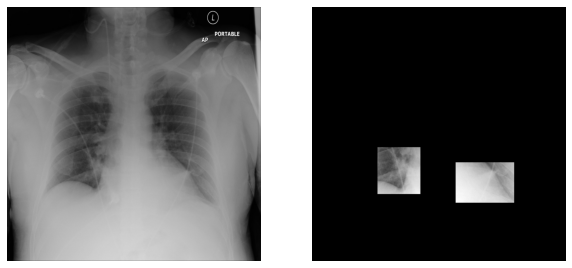

In [17]:
# Load and display random sample and their bounding boxes

class_ids = [0]
while class_ids[0] == 0:  ## look for a mask
    image_id = random.choice(dataset_train.image_ids)
    image_fp = dataset_train.image_reference(image_id)
    image = dataset_train.load_image(image_id)
    mask, class_ids = dataset_train.load_mask(image_id)

print(image.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
masked = np.zeros(image.shape[:2])
for i in range(mask.shape[2]):
    masked += image[:, :, 0] * mask[:, :, i]
plt.imshow(masked, cmap='gray')
plt.axis('off')

print(image_fp)
print(class_ids)

C:\AnacondaPython\envs\tensorflow\lib\site-packages\imgaug\imgaug.py:184: DeprecationWarning: Function `ContrastNormalization()` is deprecated. Use `imgaug.contrast.LinearContrast` instead.
  warn_deprecated(msg, stacklevel=3)


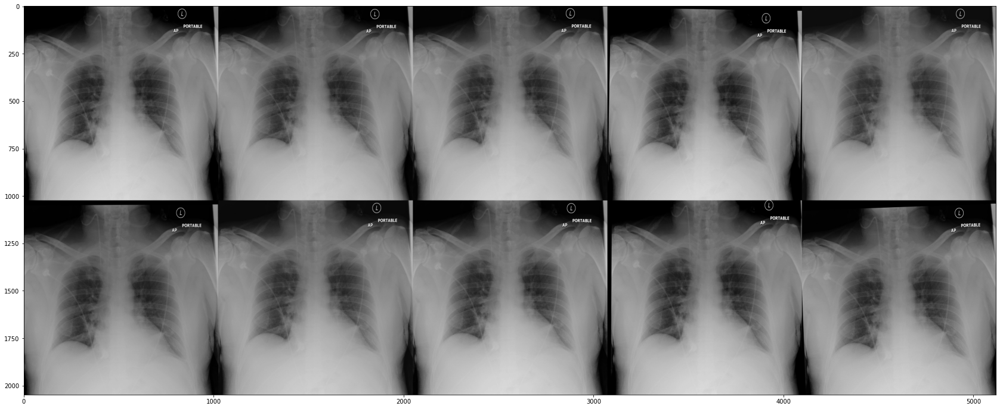

In [18]:
# Image augmentation (light but constant)
augmentation = iaa.Sequential([
    iaa.OneOf([ ## geometric transform
        iaa.Affine(
            scale={"x": (0.98, 1.02), "y": (0.98, 1.04)},
            translate_percent={"x": (-0.02, 0.02), "y": (-0.04, 0.04)},
            rotate=(-2, 2),
            shear=(-1, 1),
        ),
        iaa.PiecewiseAffine(scale=(0.001, 0.025)),
    ]),
    iaa.OneOf([ ## brightness or contrast
        iaa.Multiply((0.9, 1.1)),
        iaa.ContrastNormalization((0.9, 1.1)),
    ]),
    iaa.OneOf([ ## blur or sharpen
        iaa.GaussianBlur(sigma=(0.0, 0.1)),
        iaa.Sharpen(alpha=(0.0, 0.1)),
    ]),
])

# test on the same image as above
imggrid = augmentation.draw_grid(image[:, :, 0], cols=5, rows=2)
plt.figure(figsize=(30, 12))
_ = plt.imshow(imggrid[:, :, 0], cmap='gray')

In [19]:
print(tf.__version__)

2.8.0


In [20]:
model = modellib.MaskRCNN(mode='training',  model_dir=ROOT_DIR,config=config)

# Exclude the last layers because they require a matching
# number of classes
model.load_weights(COCO_WEIGHTS_PATH, by_name=True, exclude=[
    "mrcnn_class_logits", "mrcnn_bbox_fc",
    "mrcnn_bbox", "mrcnn_mask"])

In [21]:
LEARNING_RATE = 0.0006

# Train Mask-RCNN Model 
import warnings 
warnings.filterwarnings("ignore")

In [22]:
%%time
## train heads with higher lr to speedup the learning
history = model.train(dataset_train, dataset_val,
            learning_rate=LEARNING_RATE*2,
            epochs=2,
            layers='heads',
            augmentation=None)  ## no need to augment yet

# history = model.keras_model.history.history


Starting at epoch 0. LR=0.0012

Checkpoint Path: D://Learrning//great learning//capston Proj//dataset\pneumonia20240320T2057\mask_rcnn_pneumonia_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
rpn_model              (Functional)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistributed)
mrcnn_mask_bn4         (TimeDistributed)
mrcnn_bbox_fc          (TimeD

In [23]:
history = model.keras_model.history.history
history

{'loss': [3.0836942303180694, 1.9130138206481933],
 'rpn_class_loss': [0.08687224984169006, 0.04488518834114075],
 'rpn_bbox_loss': [1.4497984647750854, 0.6015039086341858],
 'mrcnn_class_loss': [0.2743751108646393, 0.2569710910320282],
 'mrcnn_bbox_loss': [0.808597207069397, 0.5902817249298096],
 'mrcnn_mask_loss': [0.4640519320964813, 0.419371634721756],
 'val_loss': [2.172896957397461, 1.9498254299163817],
 'val_rpn_class_loss': [0.050276003777980804, 0.044946618378162384],
 'val_rpn_bbox_loss': [0.6595333814620972, 0.5145012140274048],
 'val_mrcnn_class_loss': [0.35162219405174255, 0.3335401713848114],
 'val_mrcnn_bbox_loss': [0.6818496584892273, 0.6312446594238281],
 'val_mrcnn_mask_loss': [0.42961564660072327, 0.425592839717865]}

In [24]:
%%time
new_history_1 = model.train(dataset_train, dataset_val,
            learning_rate=LEARNING_RATE,
            epochs=6,
            layers='all',
            augmentation=augmentation)

new_history = model.keras_model.history.history
for k in new_history: history[k] = history[k] + new_history[k]


Starting at epoch 2. LR=0.0006

Checkpoint Path: D://Learrning//great learning//capston Proj//dataset\pneumonia20240320T2057\mask_rcnn_pneumonia_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (BatchNorm)
res3a_bra

Epoch 3/6
200/200 [==============================] - 1100s 5s/step - batch: 99.5000 - size: 8.0000 - loss: 3.5760 - rpn_class_loss: 0.0395 - rpn_bbox_loss: 0.5168 - mrcnn_class_loss: 0.2560 - mrcnn_bbox_loss: 0.5490 - mrcnn_mask_loss: 0.4268 - val_loss: 3.5847 - val_rpn_class_loss: 0.0397 - val_rpn_bbox_loss: 0.5159 - val_mrcnn_class_loss: 0.2586 - val_mrcnn_bbox_loss: 0.5372 - val_mrcnn_mask_loss: 0.4410
Epoch 4/6
200/200 [==============================] - 1038s 5s/step - batch: 99.5000 - size: 8.0000 - loss: 3.3789 - rpn_class_loss: 0.0336 - rpn_bbox_loss: 0.4762 - mrcnn_class_loss: 0.2387 - mrcnn_bbox_loss: 0.5213 - mrcnn_mask_loss: 0.4196 - val_loss: 3.2764 - val_rpn_class_loss: 0.0321 - val_rpn_bbox_loss: 0.4943 - val_mrcnn_class_loss: 0.2080 - val_mrcnn_bbox_loss: 0.4980 - val_mrcnn_mask_loss: 0.4058
Epoch 5/6
200/200 [==============================] - 1052s 5s/step - batch: 99.5000 - size: 8.0000 - loss: 3.2575 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 0.4623 - mrcnn_class_loss:

In [25]:
%%time
new_history2 =model.train(dataset_train, dataset_val,
            learning_rate=LEARNING_RATE/5,
            epochs=2,
            layers='all',
            augmentation=augmentation)


#for k in new_history: history[k] = history[k] + new_history[k]


Starting at epoch 6. LR=0.00011999999999999999

Checkpoint Path: D://Learrning//great learning//capston Proj//dataset\pneumonia20240320T2057\mask_rcnn_pneumonia_{epoch:04d}.h5
Selecting layers to train
conv1                  (Conv2D)
bn_conv1               (BatchNorm)
res2a_branch2a         (Conv2D)
bn2a_branch2a          (BatchNorm)
res2a_branch2b         (Conv2D)
bn2a_branch2b          (BatchNorm)
res2a_branch2c         (Conv2D)
res2a_branch1          (Conv2D)
bn2a_branch2c          (BatchNorm)
bn2a_branch1           (BatchNorm)
res2b_branch2a         (Conv2D)
bn2b_branch2a          (BatchNorm)
res2b_branch2b         (Conv2D)
bn2b_branch2b          (BatchNorm)
res2b_branch2c         (Conv2D)
bn2b_branch2c          (BatchNorm)
res2c_branch2a         (Conv2D)
bn2c_branch2a          (BatchNorm)
res2c_branch2b         (Conv2D)
bn2c_branch2b          (BatchNorm)
res2c_branch2c         (Conv2D)
bn2c_branch2c          (BatchNorm)
res3a_branch2a         (Conv2D)
bn3a_branch2a          (Batc

In [26]:
new_history

{'loss': [3.576004112958908,
  3.3788726317882536,
  3.25745086312294,
  3.1337632393836974],
 'rpn_class_loss': [0.039470549672842026,
  0.0335860475897789,
  0.03133852779865265,
  0.02932998165488243],
 'rpn_bbox_loss': [0.5167896151542664,
  0.4761902093887329,
  0.46232137084007263,
  0.4317075312137604],
 'mrcnn_class_loss': [0.2560274600982666,
  0.23874549567699432,
  0.22220641374588013,
  0.21762388944625854],
 'mrcnn_bbox_loss': [0.5489606857299805,
  0.5212969779968262,
  0.49854832887649536,
  0.48319369554519653],
 'mrcnn_mask_loss': [0.42675384879112244,
  0.41961753368377686,
  0.4143105447292328,
  0.40502655506134033],
 'val_loss': [3.5846843242645265,
  3.2763502836227416,
  3.419161319732666,
  3.1680942296981813],
 'val_rpn_class_loss': [0.03969850018620491,
  0.03210816532373428,
  0.031239649280905724,
  0.027838075533509254],
 'val_rpn_bbox_loss': [0.5158947110176086,
  0.4943275451660156,
  0.5879630446434021,
  0.49341249465942383],
 'val_mrcnn_class_loss': [0

In [27]:
epochs = range(1,len(next(iter(history.values())))+1)
pd.DataFrame(history, index=epochs)

,loss,rpn_class_loss,rpn_bbox_loss,mrcnn_class_loss,mrcnn_bbox_loss,mrcnn_mask_loss,val_loss,val_rpn_class_loss,val_rpn_bbox_loss,val_mrcnn_class_loss,val_mrcnn_bbox_loss,val_mrcnn_mask_loss
1,3.083694,0.086872,1.449798,0.274375,0.808597,0.464052,2.172897,0.050276,0.659533,0.351622,0.681850,0.429616
2,1.913014,0.044885,0.601504,0.256971,0.590282,0.419372,1.949825,0.044947,0.514501,0.333540,0.631245,0.425593
3,3.576004,0.039471,0.516790,0.256027,0.548961,0.426754,3.584684,0.039699,0.515895,0.258564,0.537193,0.440992
4,3.378873,0.033586,0.476190,0.238745,0.521297,0.419618,3.276350,0.032108,0.494328,0.207990,0.497983,0.405767
5,3.257451,0.031339,0.462321,0.222206,0.498548,0.414311,3.419161,0.031240,0.587963,0.219412,0.475119,0.395848
6,3.133763,0.029330,0.431708,0.217624,0.483194,0.405027,3.168094,0.027838,0.493412,0.192490,0.471777,0.398529


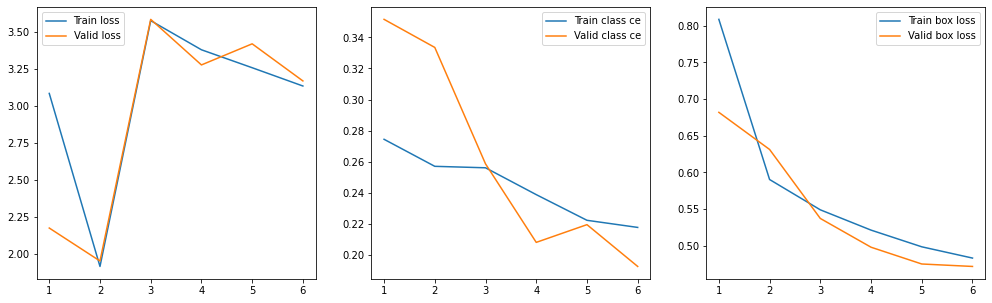

In [28]:
plt.figure(figsize=(17,5))

plt.subplot(131)
plt.plot(epochs, history["loss"], label="Train loss")
plt.plot(epochs, history["val_loss"], label="Valid loss")
plt.legend()
plt.subplot(132)
plt.plot(epochs, history["mrcnn_class_loss"], label="Train class ce")
plt.plot(epochs, history["val_mrcnn_class_loss"], label="Valid class ce")
plt.legend()
plt.subplot(133)
plt.plot(epochs, history["mrcnn_bbox_loss"], label="Train box loss")
plt.plot(epochs, history["val_mrcnn_bbox_loss"], label="Valid box loss")
plt.legend()

plt.show()

In [29]:
best_epoch = np.argmin(history["val_loss"])
print("Best Epoch:", best_epoch + 1, history["val_loss"][best_epoch])

Best Epoch: 2 1.9498254299163817


In [30]:
# select trained model 
dir_names = next(os.walk(model.model_dir))[1]
key = config.NAME.lower()
dir_names = filter(lambda f: f.startswith(key), dir_names)
dir_names = sorted(dir_names)

if not dir_names:
    import errno
    raise FileNotFoundError(
        errno.ENOENT,
        "Could not find model directory under {}".format(self.model_dir))
    
fps = []
# Pick last directory
for d in dir_names: 
    dir_name = os.path.join(model.model_dir, d)
    # Find the last checkpoint
    checkpoints = next(os.walk(dir_name))[2]
    checkpoints = filter(lambda f: f.startswith("mask_rcnn"), checkpoints)
    checkpoints = sorted(checkpoints)
    if not checkpoints:
        print('No weight files in {}'.format(dir_name))
    else:
        checkpoint = os.path.join(dir_name, checkpoints[best_epoch])
        fps.append(checkpoint)

model_path = sorted(fps)[-1]
print('Found model {}'.format(model_path))

No weight files in D://Learrning//great learning//capston Proj//dataset\pneumonia20240317T1642
No weight files in D://Learrning//great learning//capston Proj//dataset\pneumonia20240317T1838
Found model D://Learrning//great learning//capston Proj//dataset\pneumonia20240320T2057\mask_rcnn_pneumonia_0002.h5


In [31]:
class InferenceConfig(DetectorConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

inference_config = InferenceConfig()

# Recreate the model in inference mode
model = modellib.MaskRCNN(mode='inference', 
                          config=inference_config,
                          model_dir=ROOT_DIR)

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Instructions for updating:
Use fn_output_signature instead
Loading weights from  D://Learrning//great learning//capston Proj//dataset\pneumonia20240320T2057\mask_rcnn_pneumonia_0002.h5
Re-starting from epoch 2


In [32]:
# set color for class
def get_colors_for_class_ids(class_ids):
    colors = []
    for class_id in class_ids:
        if class_id == 1:
            colors.append((.941, .204, .204))
    return colors

### How does the predicted box compared to the expected value? Let's use the validation dataset to check. 

Note that we trained only one epoch for **demonstration purposes ONLY**. You might be able to improve performance running more epochs. 

(128, 128, 3)

*** No instances to display *** 



<Figure size 360x360 with 0 Axes>

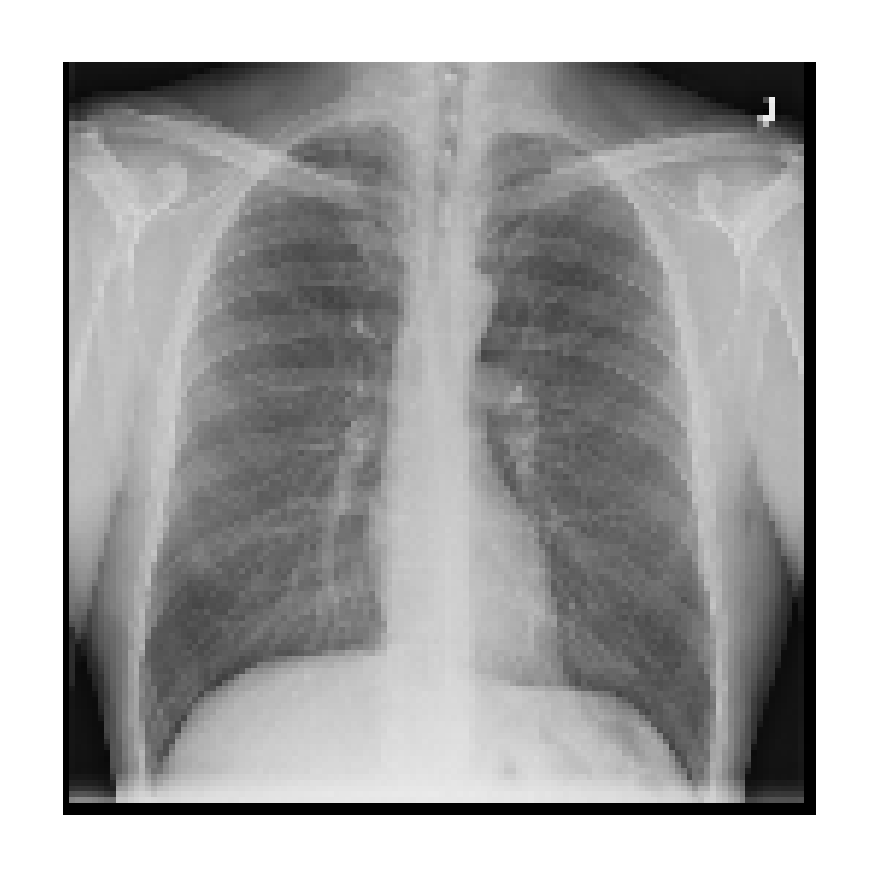

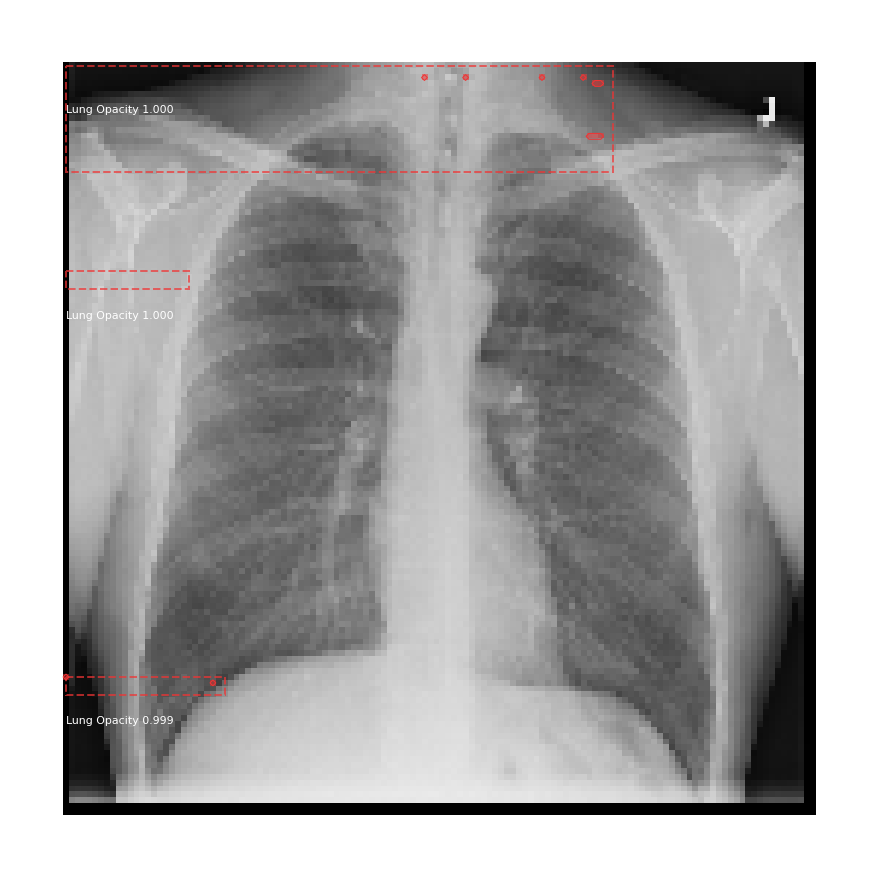

(128, 128, 3)

*** No instances to display *** 



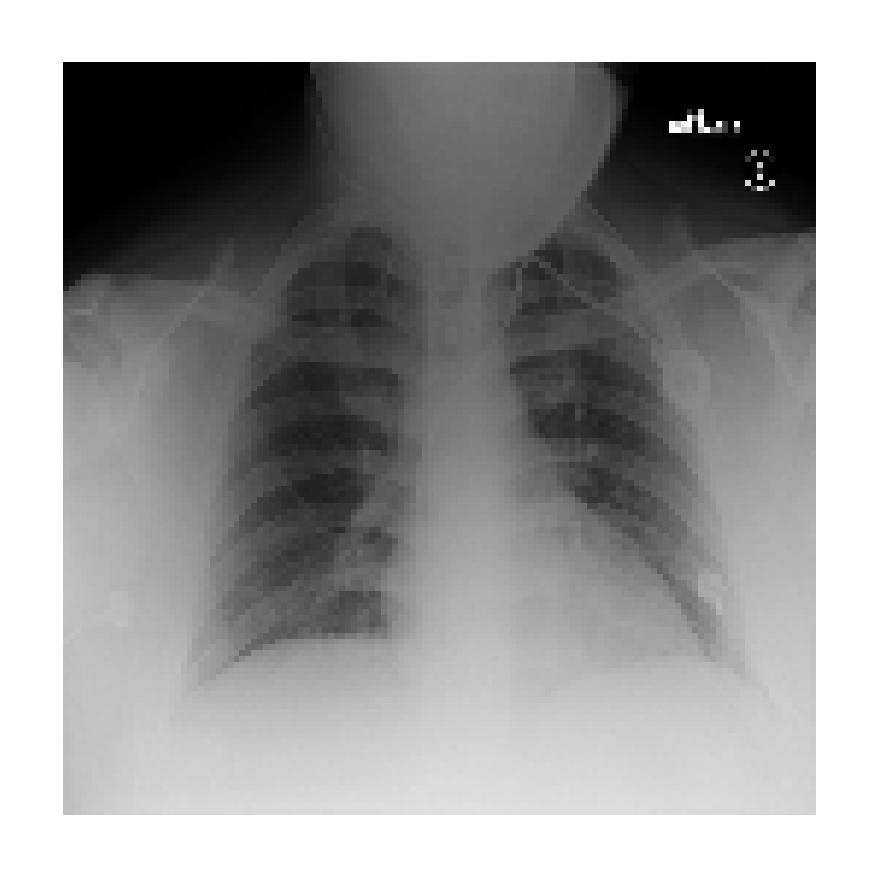

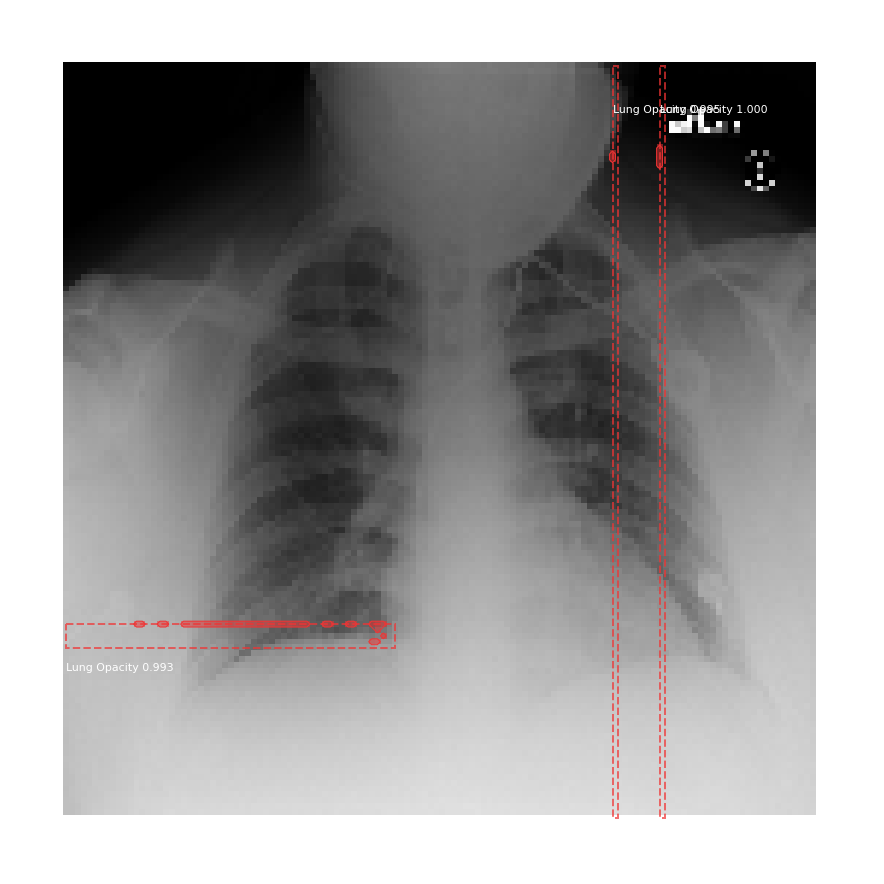

(128, 128, 3)

*** No instances to display *** 



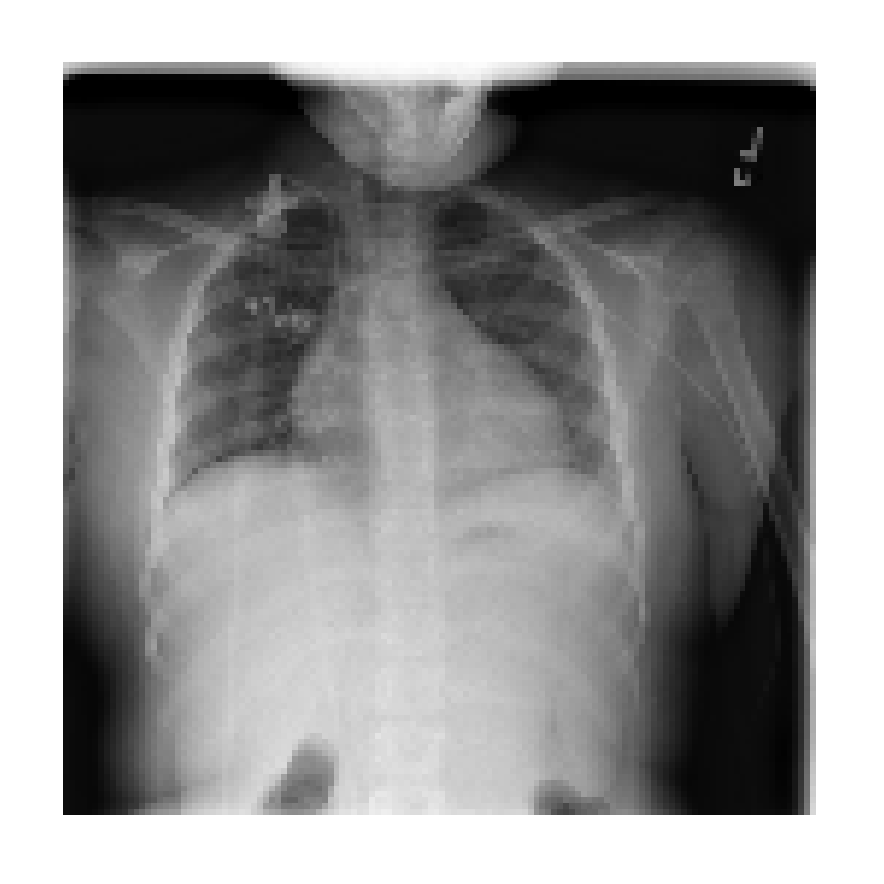

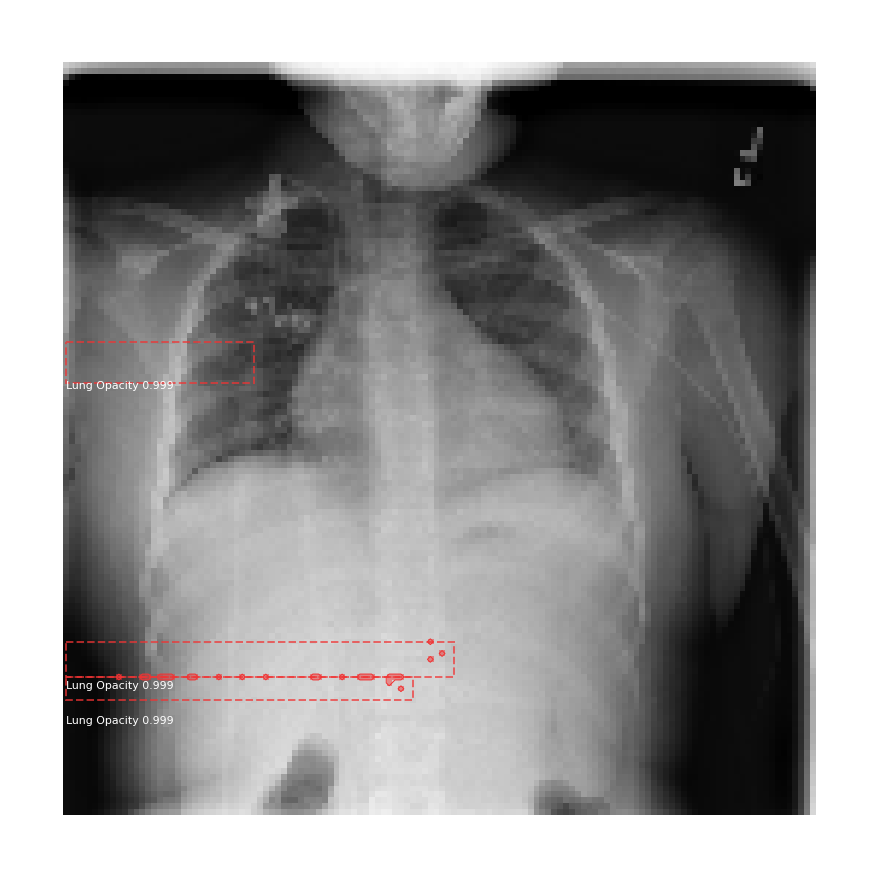

In [33]:
# Show few example of ground truth vs. predictions on the validation dataset 
dataset = dataset_val
fig = plt.figure(figsize=(5,5))

for i in range(3):
     
    image_id = random.choice(dataset.image_ids)
    
    original_image, image_meta, gt_class_id, gt_bbox, gt_mask =\
        modellib.load_image_gt(dataset_val, inference_config, 
                               image_id)
    
    # print(original_image.shape)
    # plt.subplot(3, 2, 2*i + 1)
    visualize.display_instances(original_image, gt_bbox, gt_mask, gt_class_id, 
                                dataset.class_names,
                                colors=get_colors_for_class_ids(gt_class_id))
    
    # plt.subplot(3, 2, 2*i + 2)
    results = model.detect([original_image]) #, verbose=1)
    r = results[0]
    visualize.display_instances(original_image, r['rois'], r['masks'], r['class_ids'], 
                                dataset.class_names, r['scores'], 
                                colors=get_colors_for_class_ids(r['class_ids']))

In [34]:
test_image_fps = get_dicom_fps(test_dicom_dir)

In [35]:
# Make predictions on test images, write out sample submission
def predict(image_fps, filepath='submission_final.csv', min_conf=0.95):
    # assume square image
    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]
    #resize_factor = ORIG_SIZE
    with open(filepath, 'w') as file:
        file.write("patientId,PredictionString\n")

        for image_id in tqdm(image_fps):
            ds = pydicom.read_file(image_id)
            image = ds.pixel_array
            # If grayscale. Convert to RGB for consistency.
            if len(image.shape) != 3 or image.shape[2] != 3:
                image = np.stack((image,) * 3, -1)
            image, window, scale, padding, crop = utils.resize_image(
                image,
                min_dim=config.IMAGE_MIN_DIM,
                min_scale=config.IMAGE_MIN_SCALE,
                max_dim=config.IMAGE_MAX_DIM,
                mode=config.IMAGE_RESIZE_MODE)

            patient_id = os.path.splitext(os.path.basename(image_id))[0]

            results = model.detect([image])
            r = results[0]

            out_str = ""
            out_str += patient_id
            out_str += ","
            assert( len(r['rois']) == len(r['class_ids']) == len(r['scores']) )
            if len(r['rois']) == 0:
                pass
            else:
                num_instances = len(r['rois'])

                for i in range(num_instances):
                    if r['scores'][i] > min_conf:
                        out_str += ' '
                        out_str += str(round(r['scores'][i], 2))
                        out_str += ' '

                        # x1, y1, width, height
                        x1 = r['rois'][i][1]
                        y1 = r['rois'][i][0]
                        width = r['rois'][i][3] - x1
                        height = r['rois'][i][2] - y1
                        bboxes_str = "{} {} {} {}".format(x1*resize_factor, y1*resize_factor, \
                                                           width*resize_factor, height*resize_factor)
                        out_str += bboxes_str

            file.write(out_str+"\n")

In [36]:
import pickle

In [37]:
# Pickle the model to a file
with open('rcnnmodelfnl1.pkl', 'wb') as f:
  pickle.dump(model, f)

INFO:tensorflow:Assets written to: ram://aabe065f-874a-44f6-98f5-75b15b6be25b/assets


In [38]:
submission_fp = os.path.join(ROOT_DIR, 'submissionfinal1.csv')
predict(test_image_fps, filepath=submission_fp)
print(submission_fp)

100%|██████████████████████████████████████████████████████████████████████████████| 3000/3000 [11:22<00:00,  4.40it/s]

D://Learrning//great learning//capston Proj//dataset\submissionfinal1.csv


2bb5fb3e-0a7d-42c1-bec3-bf86f6fe4029
[ 81   0 107  65]
x 0 y 648 h 520 w 208
[19  0 21  1]
x 0 y 152 h 8 w 16
[69  0 79 14]
x 0 y 552 h 112 w 80
14cf8563-6ed2-4458-8659-cd2618a74f7e
[ 2  0 15  2]
x 0 y 16 h 16 w 104
[18  0 19  1]
x 0 y 144 h 8 w 8
[79  0 87 24]
x 0 y 632 h 192 w 64
1ead85b0-dada-4d3e-8a39-3989aaba75c2
[46  0 55 92]
x 0 y 368 h 736 w 72
[ 62   0  67 128]
x 0 y 496 h 1024 w 40
[ 74   0  76 128]
x 0 y 592 h 1024 w 16
2838eabe-5ddc-4ddd-8934-91e362d10d18
[107   0 109 128]
x 0 y 856 h 1024 w 16
[105   0 108 128]
x 0 y 840 h 1024 w 24
[82  0 85 63]
x 0 y 656 h 504 w 24


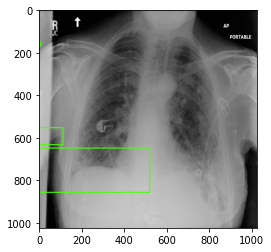

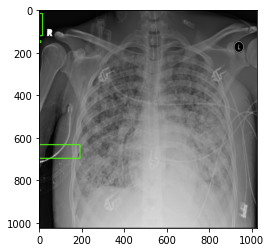

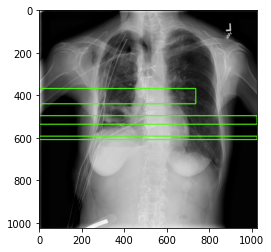

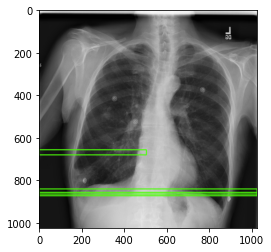

In [39]:
# show a few test image detection example
def visualize(): 
    image_id = random.choice(test_image_fps)
    ds = pydicom.read_file(image_id)
    
    # original image 
    image = ds.pixel_array
    
    # assume square image 
    resize_factor = ORIG_SIZE / config.IMAGE_SHAPE[0]
    
    # If grayscale. Convert to RGB for consistency.
    if len(image.shape) != 3 or image.shape[2] != 3:
        image = np.stack((image,) * 3, -1) 
    resized_image, window, scale, padding, crop = utils.resize_image(
        image,
        min_dim=config.IMAGE_MIN_DIM,
        min_scale=config.IMAGE_MIN_SCALE,
        max_dim=config.IMAGE_MAX_DIM,
        mode=config.IMAGE_RESIZE_MODE)

    patient_id = os.path.splitext(os.path.basename(image_id))[0]
    print(patient_id)

    results = model.detect([resized_image])
    r = results[0]
    for bbox in r['rois']: 
        print(bbox)
        x1 = int(bbox[1] * resize_factor)
        y1 = int(bbox[0] * resize_factor)
        x2 = int(bbox[3] * resize_factor)
        y2 = int(bbox[2]  * resize_factor)
        cv2.rectangle(image, (x1,y1), (x2,y2), (77, 255, 9), 3, 1)
        width = x2 - x1 
        height = y2 - y1 
        print("x {} y {} h {} w {}".format(x1, y1, width, height))
    plt.figure() 
    plt.imshow(image, cmap=plt.cm.gist_gray)

visualize()
visualize()
visualize()
visualize()

## YOLO8 implementation

In [2]:
%pip install ultralytics

  Using cached ultralytics-8.1.30-py3-none-any.whl (722 kB)
  Using cached py_cpuinfo-9.0.0-py3-none-any.whl (22 kB)
  Using cached thop-0.1.1.post2209072238-py3-none-any.whl (15 kB)
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.50.2
    Uninstalling tqdm-4.50.2:
      Successfully uninstalled tqdm-4.50.2
Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd
import os
import random
import shutil

import cv2
import pydicom
from PIL import Image

import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tqdm import tqdm

import torch
from ultralytics import YOLO

np.random.seed(1111)

In [4]:
torch.cuda.is_available()

True

In [9]:
CSV_FILE = 'stage_2_train_labels.csv'
TRAIN_SRC_DIR = 'train_images/stage_2_train_images/'
TEST_SRC_DIR = 'test_images/stage_2_test_images/'
DATASET_DIR = 'D://Learrning//great learning//capston Proj//dataset//yolo//'
TEST_IMG_DIR = 'D://Learrning//great learning//capston Proj//dataset///test_images_yolo/'



In [ ]:
os.mkdir(DATASET_DIR)
os.mkdir(DATASET_DIR + 'images/')
os.mkdir(DATASET_DIR + 'images/train/')
os.mkdir(DATASET_DIR + 'images/val/')
os.mkdir(DATASET_DIR + 'images/test/')
os.mkdir(DATASET_DIR + 'labels/')
os.mkdir(DATASET_DIR + 'labels/train/')
os.mkdir(DATASET_DIR + 'labels/val/')
os.mkdir(DATASET_DIR + 'labels/test/')
os.mkdir(TEST_IMG_DIR)

In [10]:
annotations = pd.read_csv(CSV_FILE)
print(annotations.info())
annotations.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB
None


,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [11]:
positive_annotations = annotations[annotations.Target == 1]
negative_annotations = annotations[annotations.Target == 0]

print(positive_annotations['patientId'].drop_duplicates().shape[0])
print(negative_annotations['patientId'].drop_duplicates().shape[0])
print(negative_annotations['patientId'].shape[0])

negative_sample = negative_annotations.sample(600)
negative_sample['patientId'].shape[0]

annotations = pd.concat([positive_annotations, negative_sample])
print(annotations.shape)
annotations.head()

6012
20672
20672
(10155, 6)


,patientId,x,y,width,height,Target
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
5,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1
8,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1
9,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1
14,00aecb01-a116-45a2-956c-08d2fa55433f,288.0,322.0,94.0,135.0,1


In [12]:
patient_id_series = annotations.patientId.drop_duplicates()
print('Number of images:', patient_id_series.size)
train_series, val_series = train_test_split(patient_id_series, test_size=0.1, random_state=42)
print('Train set number:', len(train_series))
print('Validation set number:', len(val_series))

Number of images: 6612
Train set number: 5950
Validation set number: 662


In [17]:
for patient_id in tqdm(train_series):
    src_path = TRAIN_SRC_DIR + patient_id + '.dcm'
    dcm_data = pydicom.dcmread(src_path)
    image_array = dcm_data.pixel_array
    image = Image.fromarray(image_array)
    image.save(DATASET_DIR + 'images/train/' + patient_id + '.jpg')
print('Images moved to train folder:', len(os.listdir(DATASET_DIR + 'images/train/')))
    
for patient_id in tqdm(val_series):
    src_path = TRAIN_SRC_DIR + patient_id + '.dcm'
    dcm_data = pydicom.dcmread(src_path)
    image_array = dcm_data.pixel_array
    image = Image.fromarray(image_array)
    image.save(DATASET_DIR + 'images/val/' + patient_id + '.jpg')
print('Images moved to val folder:', len(os.listdir(DATASET_DIR + 'images/val/')))

100%|██████████████████████████████████████████████████████████████████████████████| 5950/5950 [01:03<00:00, 93.52it/s]


Images moved to train folder: 5950


100%|████████████████████████████████████████████████████████████████████████████████| 662/662 [00:06<00:00, 98.12it/s]

Images moved to val folder: 662


In [15]:
def translate_bbox(bbox):
    img_size = 1024 # rsna defualt image size
    
    top_left_x = bbox[0]
    top_left_y = bbox[1]
    absolute_w = bbox[2]
    absolute_h = bbox[3]

    relative_w = absolute_w / img_size
    relative_h = absolute_h / img_size
    
    relative_x = top_left_x / img_size + relative_w / 2
    relative_y = top_left_y / img_size + relative_h / 2
    
    return relative_x, relative_y, relative_w, relative_h
    
def revert_bbox(rx, ry, rw, rh):
    img_size = 1024 # rsna defualt image size
    
    x = (rx-rw/2)*img_size
    y = (ry-rh/2)*img_size
    w = rw*img_size
    h = rh*img_size
    
    return x, y, w, h
    
    
def save_label(label_dir, patient_id, bbox):
    label_fp = os.path.join(label_dir, patient_id + '.txt')
    
    f = open(label_fp, "a")
    if (bbox == 'nan').all():
        f.close()
        return
    
    x, y, w, h = translate_bbox(bbox)
    
    line = f"0 {x} {y} {w} {h}\n"
    
    f.write(line)
    f.close()

In [19]:
LABELS_DIR = "./labels_temp/"
os.mkdir(LABELS_DIR)

for row in annotations.values:
    if pd.notna(row[1:5]).all():
        save_label(LABELS_DIR, row[0], row[1:5])
    
for patient_id in train_series:
    if os.path.isfile(LABELS_DIR + patient_id + '.txt'):
        shutil.copy(LABELS_DIR + patient_id + '.txt', DATASET_DIR + 'labels/train/')
    
for patient_id in val_series:
    if os.path.isfile(LABELS_DIR + patient_id + '.txt'):
        shutil.copy(LABELS_DIR + patient_id + '.txt', DATASET_DIR + 'labels/val/')
    
shutil.rmtree(LABELS_DIR)

0 0.7412109375 0.49658203125 0.162109375 0.0966796875



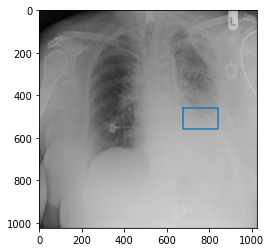

In [20]:
demo_patient_id = val_series.values[8]
demo_img_path = DATASET_DIR + 'images/val/' + demo_patient_id + '.jpg'
demo_label_path = DATASET_DIR + 'labels/val/' + demo_patient_id + '.txt'

plt.imshow(cv2.imread(demo_img_path))

with open(demo_label_path, "r") as f:
    for line in f:
        print(line)
        class_id, rx, ry, rw, rh = list(map(float, line.strip().split()))
        
        x, y, w, h = revert_bbox(rx, ry, rw, rh)
        plt.plot([x, x, x+w, x+w, x], [y, y+h, y+h, y, y])

In [21]:
%%writefile config.yaml

path: 'D://Learrning//great learning//capston Proj//dataset//yolo' # dataset root dir
train: images/train  # train images (relative to 'path')
val: images/val  # val images (relative to 'path')

# Classes
names:
  0: pneumonia

Writing config.yaml


In [5]:
model = YOLO('yolov8l.pt') # yaml

In [6]:
model.to('cuda:0')

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(128, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(320, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(128, eps=0.001, momentum=0.03, affine=True, track_r

In [7]:
results = model.train(data='config.yaml', epochs=10,device=0)

Ultralytics YOLOv8.1.30 🚀 Python-3.8.5 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 2060, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolov8l.pt, data=config.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes

100%|█████████████████████████████████████████████████████████████████████████████| 6.23M/6.23M [00:01<00:00, 4.02MB/s]


AMP: checks passed ✅


train: Scanning D:\Learrning\great learning\capston Proj\dataset\yolo\labels\train.cache... 5405 images, 545 background
val: Scanning D:\Learrning\great learning\capston Proj\dataset\yolo\labels\val.cache... 607 images, 55 backgrounds, 0 c


Plotting labels to runs\detect\train2\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train2
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      10.6G       2.27      2.801      2.394         23        640: 100%|██████████| 372/372 [1:38:38<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:18

                   all        662        962      0.012      0.797     0.0225    0.00639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      10.2G      2.216      2.466      2.253         19        640: 100%|██████████| 372/372 [1:24:56<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:19


                   all        662        962      0.238      0.181      0.123      0.038

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      10.3G      2.148      2.382      2.169         24        640: 100%|██████████| 372/372 [1:32:01<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:22

                   all        662        962     0.0236      0.052    0.00763    0.00175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      10.2G       2.09      2.245      2.086         21        640: 100%|██████████| 372/372 [1:27:26<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:22

                   all        662        962      0.372      0.364        0.3      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      10.2G      2.049      2.149      2.042         24        640: 100%|██████████| 372/372 [1:18:41<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:44

                   all        662        962      0.401      0.452       0.39      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      10.3G      2.023      2.077       1.98         18        640: 100%|██████████| 372/372 [1:36:13<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:29

                   all        662        962      0.442      0.484      0.409      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      10.2G      1.993      2.036      1.942         20        640: 100%|██████████| 372/372 [1:22:32<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:56

                   all        662        962       0.39      0.437      0.349      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      10.2G      1.956       1.98      1.921         20        640: 100%|██████████| 372/372 [1:23:04<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:37

                   all        662        962      0.493      0.497      0.471      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      10.2G      1.929      1.945      1.893         24        640: 100%|██████████| 372/372 [1:17:12<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:39

                   all        662        962      0.498      0.473       0.44      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      10.2G       1.91      1.892      1.876         22        640: 100%|██████████| 372/372 [1:10:55<00:00,
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [01:26

                   all        662        962      0.486      0.492      0.467      0.187



10 epochs completed in 14.333 hours.
Optimizer stripped from runs\detect\train2\weights\last.pt, 87.6MB
Optimizer stripped from runs\detect\train2\weights\best.pt, 87.6MB

Validating runs\detect\train2\weights\best.pt...
Ultralytics YOLOv8.1.30 🚀 Python-3.8.5 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 2060, 6144MiB)
Model summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:22


                   all        662        962      0.487      0.494      0.468      0.187
Speed: 0.4ms preprocess, 28.6ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs\detect\train2


In [8]:
def plot_val_pred(demo_patient_id, verbose=True, split='val'):
    demo_img_path = DATASET_DIR + f'images/{split}/' + demo_patient_id + '.jpg'
    demo_label_path = DATASET_DIR + f'labels/{split}/' + demo_patient_id + '.txt'

    res = model(demo_img_path, verbose=verbose)
    if verbose:
        print(res[0].probs)
        print(res[0].boxes.xywh)

    plt.imshow(cv2.imread(demo_img_path))

    img_size = 1014
    if os.path.isfile(demo_label_path):
        with open(demo_label_path, "r") as f:
            for line in f:
                if verbose:
                    print(line)
                class_id, rx, ry, rw, rh = list(map(float, line.strip().split()))

                x, y, w, h = revert_bbox(rx, ry, rw, rh)
                plt.plot([x, x, x+w, x+w, x], [y, y+h, y+h, y, y], c='blue')

                
    for box in res[0].boxes.xywh.cpu():
        px, py, pw, ph = box
        plt.plot([px-pw/2, px-pw/2, px+pw/2, px+pw/2, px-pw/2], [py-ph/2, py+ph/2, py+ph/2, py-ph/2, py-ph/2], c='orange')

<Figure size 432x288 with 0 Axes>

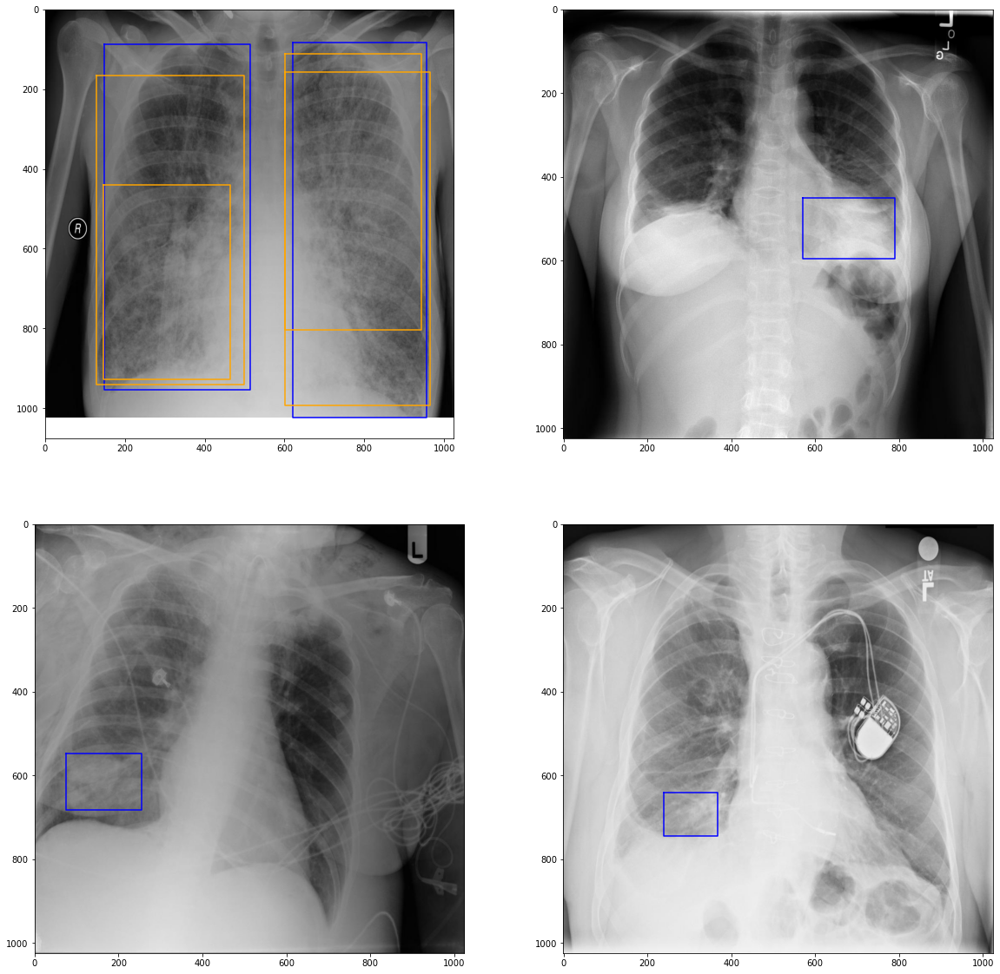

In [17]:
def random_value(series):
    return series.iloc[random.randrange(0, len(series))]

def plot_examples(series, rows = 5, cols = 2, split='val'):
    plt.suptitle(split)
    plt.figure(figsize=(10*cols,10*rows))
    for h in range(rows):
        for w in range(cols):
            plt.subplot(rows, cols, h*2+w+1)
            plot_val_pred(random_value(series), verbose=False, split=split)

plot_examples(train_series, 2, 2, 'train')

<Figure size 432x288 with 0 Axes>

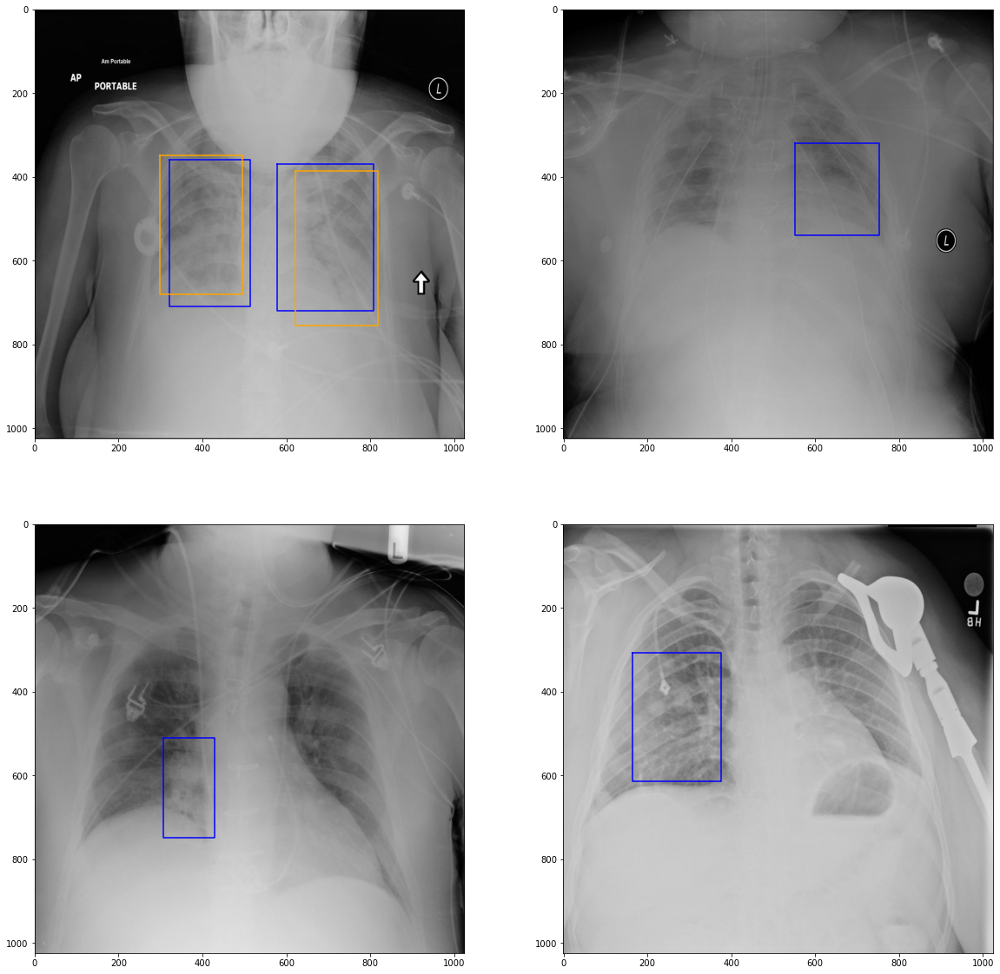

In [18]:
plot_examples(val_series, 2, 2, 'val')

## pickle the model 

In [24]:
model.save(filename='yolo8_pnecapstone.pt')

In [25]:
import pickle

modelyolo = torch.load('yolo8_pnecapstone.pt')
# Save the model to a pickle file
with open('yolov8n_pne.pkl', 'wb') as f:
    pickle.dump(modelyolo, f,protocol=pickle.HIGHEST_PROTOCOL)

In [19]:
for file in tqdm(os.listdir(TEST_SRC_DIR)):
    src_path = TEST_SRC_DIR + file
    dcm_data = pydicom.dcmread(src_path)
    image_array = dcm_data.pixel_array
    image = Image.fromarray(image_array)
    image.save(TEST_IMG_DIR + os.path.splitext(file)[0] + '.jpg')

100%|██████████████████████████████████████████████████████████████████████████████| 3000/3000 [02:05<00:00, 23.84it/s]


In [27]:
results_train = results

In [28]:
results = model(TEST_IMG_DIR, verbose=False, conf=0.28) #


WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs



In [29]:
def get_id_from_path(path):
    return os.path.splitext(os.path.basename(path))[0]

print(get_id_from_path(results[1].path))
print(results[1].boxes.xywh)
print(results[1].boxes.conf)

0005d3cc-3c3f-40b9-93c3-46231c3eb813
tensor([], device='cuda:0', size=(0, 4))
tensor([], device='cuda:0')


In [30]:
with open('submissionyolo8pne.csv', 'w') as file:
    file.write("patientId,PredictionString\n")

    for result in tqdm(results):
        line = get_id_from_path(result.path) + ','
        
        for conf, xywh in zip(result.boxes.conf, result.boxes.xywh):
            x, y, w, h = xywh
            line += f"{conf:.2f} {x-w/2:.2f} {y-h/2:.2f} {w:.2f} {h:.2f} "
            
        line = line.strip()
        file.write(line+"\n")

100%|████████████████████████████████████████████████████████████████████████████| 3000/3000 [00:00<00:00, 4248.84it/s]


### over lap box checking and update the submission file 

In [32]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

In [33]:
path = Path('submissionyolo8pne.csv')
df = pd.read_csv(path)
print(path.name)

df['pred_count'] = df['PredictionString'].apply(lambda x: 0 if pd.isna(x) else int(len(x.split()) / 5))
df['pred_count'].value_counts().sort_index()

submissionyolo8pne.csv


0    2674
1     214
2     108
3       4
Name: pred_count, dtype: int64

In [34]:
def str_to_boxes(s: str) -> list:  # return c,x,y,w,h
    if pd.isna(s) or len(s) == 0:
        return []

    boxes = []
    n = len(s.split()) // 5
    for i in range(n):
        box = s.split()[i * 5:i * 5 + 5]
        boxes.append(list(map(float, box)))

    return boxes

def remove_empty_boxes(s: str) -> str:
    if pd.isna(s) or len(s) == 0:
        return s

    n = len(s.split()) // 5
    data = s.split()
    for i in range(n):
        box = data[i * 5:i * 5 + 5]
        if float(box[2]) * float(box[3]) == 0:
            s = s.replace(' '.join(map(str, box)), '').strip()

    return s

In [35]:
df['PredictionString'] = df['PredictionString'].apply(remove_empty_boxes)

In [36]:
def box_areas_utils(box1, box2):  # corner coords
    _, left_x1, left_y1, w1, h1 = box1
    _, left_x2, left_y2, w2, h2 = box2

    assert w1 * h1 * w2 * h2 > 0, 'w or h is 0'

    right_x1, right_x2 = left_x1 + w1, left_x2 + w2
    top_y1, top_y2 = left_y1 + h1, left_y2 + h2

    area1, area2 = w1 * h1, w2 * h2
    right_xi = min(right_x1, right_x2)
    left_xi = max(left_x1, left_x2)
    top_yi = min(top_y1, top_y2)
    bottom_yi = max(left_y1, left_y2)

    if right_xi <= left_xi or top_yi <= bottom_yi:
        intersection = 0
    else:
        intersection = (right_xi - left_xi) * (top_yi - bottom_yi)

    union = area1 + area2 - intersection
    return area1, area2, intersection, union


def iou(box1, box2):
    area1, area2, intersection, union = box_areas_utils(box1, box2)
    return intersection / union


def two_boxes_overlap(box1, box2) -> bool:
    return iou(box1, box2) > 0.3


def one_box_inside_another(box1, box2) -> bool:
    area1, area2, intersection, union = box_areas_utils(box1, box2)
    return intersection / area1 > 0.7 or intersection / area2 > 0.7


def merge_boxes(box1, box2) -> (float, float, float, float, float):  # c,x,y,w,h - bottom left corner (0,0)
    c1, x1, y1, w1, h1 = box1
    c2, x2, y2, w2, h2 = box2
    min_x, min_y = min([x1, x2]), min([y1, y2])
    max_x, max_y = max([x1 + w1, x2 + w2]), max([y1 + h1, y2 + h2])

    w, h = max_x - min_x, max_y - min_y
    # reduce w, h by 10%
    dw, dh = w * 0.05, h * 0.05
    w, h = w * 0.9, h * 0.9

    return (c1 + c2) / 2, (x1 + x2) / 2, (y1 + y2) / 2, (w1+w2) / 2, (h1+h2) / 2


def detect_overlapping(s: str, type='both') -> bool:
    if pd.isna(s):
        return False

    n = len(s.split()) // 5
    for i in range(n):
        box1 = list(map(float, s.split()[i * 5:i * 5 + 5]))
        for j in range(n):
            if i == j:
                continue
            box2 = list(map(float, s.split()[j * 5:j * 5 + 5]))

            if type == 'both':
                if two_boxes_overlap(box1, box2) or one_box_inside_another(box1, box2):
                    return True
            elif type == 'overlap':
                if two_boxes_overlap(box1, box2) and not one_box_inside_another(box1, box2):
                    return True
            elif type == 'inside':
                if one_box_inside_another(box1, box2):
                    return True

    return False


def merge_overlapping(s: str) -> str:
    if pd.isna(s):
        return s

    boxes = str_to_boxes(s)

    for i in range(len(boxes)):
        for j in range(i + 1, len(boxes)):
            if boxes[i] is None or boxes[j] is None:
                continue
            if two_boxes_overlap(boxes[i], boxes[j]) or \
                    one_box_inside_another(boxes[i], boxes[j]):
                boxes[i] = merge_boxes(boxes[i], boxes[j])
                boxes[j] = None

    return ' '.join([' '.join(map(str, c)) for c in boxes if c is not None]).strip()


In [37]:
df['overlaps'] = df['PredictionString'].apply(lambda s: detect_overlapping(s, type='overlap'));
df['inside_box'] = df['PredictionString'].apply(lambda s: detect_overlapping(s, type='inside'));
print(df.query('pred_count>0')['overlaps'].value_counts())
print(df.query('pred_count>0')['inside_box'].value_counts())

False    326
Name: overlaps, dtype: int64
False    321
True       5
Name: inside_box, dtype: int64


In [38]:
df[df['overlaps']]['pred_count'].value_counts().sort_index()

Series([], Name: pred_count, dtype: int64)

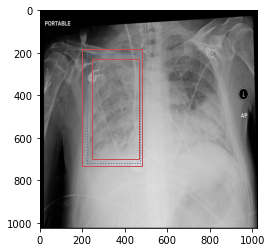

In [40]:
df['PredictionString_'] = df['PredictionString']

s = df.query('inside_box').sample(1).iloc[0]

img = Image.open(f'test_images_yolo/{s["patientId"]}.jpg')
img = img.convert('RGB')
ax = plt.gca()
boxes = str_to_boxes(s['PredictionString_'])
for b in boxes:
    rect = patches.Rectangle((b[1], b[2]), b[3], b[4], linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)

fixed_s = merge_overlapping(s['PredictionString_'])
boxes_fixed = str_to_boxes(fixed_s)
for b in boxes_fixed:
    rect = patches.Rectangle((b[1], b[2]), b[3], b[4], linewidth=1, edgecolor='b', facecolor='none', linestyle=':')
    ax.add_patch(rect)
plt.imshow(img);

In [41]:
df['PredictionString'] = df['PredictionString'].apply(merge_overlapping)

In [42]:
df[['patientId', 'PredictionString']].to_csv(path.name, index=False)

In [63]:
result_val = model.val()

Ultralytics YOLOv8.1.30 🚀 Python-3.8.5 torch-2.2.1+cu121 CUDA:0 (NVIDIA GeForce RTX 2060, 6144MiB)


val: Scanning D:\Learrning\great learning\capston Proj\dataset\yolo\labels\val.cache... 607 images, 55 backgrounds, 0 c
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [04:20


                   all        662        962      0.489      0.495      0.468      0.187
Speed: 0.6ms preprocess, 387.2ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs\detect\train23


In [76]:
result_val.results_dict

{'metrics/precision(B)': 0.48852707193435346,
 'metrics/recall(B)': 0.49480249480249483,
 'metrics/mAP50(B)': 0.46836995131312675,
 'metrics/mAP50-95(B)': 0.1869621628931632,
 'fitness': 0.21510294173515956}